# __SCODA explorer__ 
MLBI-lab, Dec. 07, 2023

- 이 주피터 노트북은 SCODA 결과를 시각화하여 확인하고 데이터 마이닝을 수행할 수 있는 코드 예제를 제공합니다. 
- 이 주피터 노트북을 사용하려면 <a href=https://mlbi-lab.net>SCODA pipeline</a>을 실행한 후 다운 받으신 SCODA 결과 파일 (xxx_results.tar.gz)이 현재 사용 중인 PC 혹은 테블릿에 저장되어 있어야 합니다.
- __Local PC에서 실행된 주피터를 사용할 경우,__ 스텝 __1A__ 의 단계에 따라 진행하면 됩니다.
- __Google Colab을 사용할 경우,__ 아래 스텝 __1B__ 의 단계에 따라 진행하면 됩니다.

## __1A. Local PC에서 실행된 주피터를 사용할 경우__
Local PC에서 실행된 주피터 프로그램으로 이 주피터 노트북을 실행 중인 경우, 다음 단계에 따라 진행하면 됩니다.

1. 다운 받은 SCODA 결과 파일 (xxx_results.tar.gz)의 압축을 풀어 h5ad 파일을 얻습니다.
2. h5ad 파일을 이 주피터 노트북 파일이 저장된 폴더에 복사합니다. (또는 파일의 경로를 확인 합니다.)
3. 아래의 코드셀에서 변수 file_h5ad를 압축해제된 h5ad파일의 경로/파일명으로 설정하여 실행하고 스텝 __2__ 로 갑니다.

In [16]:
file_h5ad = 'example_10x_mtx_human.h5ad' 

## __1B. Google Colab에서 사용할 경우__

Colab 서버에서 이 주피터 노트북을 열었고 Colab 서버에서 이 주피터노트북을 사용하려면 다음의 단계에 따라 진행하면 됩니다.

1. 먼저 구글 계정에 로그인을 해야하는데 .. 우측 상단의 "로그인" 버튼을 누르신 후, 구글 계정이 있다면 계정에 로그인을 하면 되고, 계정이 없으면 새로 만드신 후 로그인하면 됩니다. 계정에 로그인 했다면 다음으로 넘어 갑니다.
2. 좌측에 아이콘이 몇개 보일텐데 이 아이콘들 중 폴더(파일) 형태의 아이콘(아마도 맨 마지막 아이콘)이 보이는데 이걸 클릭합니다.
   - 좌측에 아이콘들이 안보이는 경우 좌측 상단(혹은 하단)에 메뉴 아이콘이 있을 거고 이를 누르면 드롭다운 메뉴가 나오고 여기서 파일 브라우저 표시를 선택합니다.
3. 그러면 좌측에 폴더 뷰가 나오고 폴더 뷰 상단에 몇 개 아이콘이 보입니다.
4. 이 아이콘들 중 파일 업로드 아이콘(네모 박스안에 위 방향 화살표가 있는 아이콘)을 클릭합니다.
5. 그러면 파일선택 창이 뜨는데 업로드할 파일(압축되어 있는 SCODA 결과 파일)을 선택하고 업로드 합니다. (혹은 업로드할 파일을 파일 뷰안으로 drag & drop 합니다.)
    - 폴더 뷰 아래에 업로드 진행 상황이 나오니 업로드가 완료될 때까지 (동그라미가 한바퀴 다 돌때까지) 기다립니다.
    - 무료 사용의 경우 업로드 시간이 꽤 걸립니다.
    - 파일업로드가 완료되었다면 폴더 뷰에 해당 파일이 업로드 된 것을 확인할 수 있고 이제 좌측의 폴더 뷰는 닫아도 됩니다. ^^
6. 아래의 코드를 실행합니다.
    - 아래 코드는 압축을 해제하여 h5ad 파일을 얻고 file_h5ad 변수를 해당 파일명으로 설정합니다.
7. 아래의 코드 실행이 완료되었다면 스텝 __2__ 로 넘어가면 됩니다.

In [7]:
import os, tarfile, shutil

flst = os.listdir()
uploaded_file = None
for f in flst:
    if f.split('.')[-1] == 'gz':
        uploaded_file = f
display(uploaded_file)

## Decompress uploaded tar.gz file and move it to the current directory
if uploaded_file.split('.')[-1] == 'gz':
    extract_path = 'uploaded'
    with tarfile.open(uploaded_file, "r:gz") as tar:
        tar.extractall(path=extract_path)
        
    file_h5ad = os.listdir(extract_path)[0]
    file = extract_path + '/%s' % file_h5ad
    if os.path.isdir(file):
        file_h5ad = os.listdir(file)[0]
        file = file + '/%s' % (file_h5ad)

    if not os.path.isfile(file_h5ad):
        shutil.move(file, '.')
        
    print('Your file: %s' % file_h5ad)

'2023.12.31.03.35.53_220.149.232.153_results.tar.gz'

Your file: example_10x_mtx_human.h5ad


## __2. Install required packages and import them__
이제 파일이 준비되었으니 필요한 패키지를 설치하고 이를 불러와서(import해서) 데이터를 들여다 볼 수 있습니다.

In [17]:
## 필요한 패키지 설치 (이미 설치되었다면 skip 해도 됩니다.)
!pip install numpy
!pip install pandas
!pip install scipy
!pip install matplotlib
!pip install scikit-learn
!pip install scikit-network
!pip install seaborn
!pip install scanpy
!pip install statannot
!pip install scoda-viz

In [18]:
## 필요한 패키지 불러오기
import copy, warnings
import anndata
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

from scodaviz.plotlib import get_population, plot_population, plot_population_grouped
from scodaviz.plotlib import filter_gsa_result, plot_gsa_bar, plot_gsa_dot
from scodaviz.plotlib import plot_cci_dot, plot_cci_circ_group, cci_get_ni_mat, cci_get_means
from scodaviz.plotlib import plot_deg, get_markers_from_deg, plot_marker_exp
from scodaviz.plotlib import plot_cnv, plot_violin, plot_pct_box, get_sample_to_group_map

warnings.filterwarnings('ignore') 

## __3. Load data__

In [2]:
## 위 단계가 성공적이 었다면 file_h5ad는 압축해제된 h5ad파일의 경로/파일명으로 설정되어 있을 겁니다.
# file_h5ad = '압축해제된 h5ad파일의 경로/파일명으로 대체'

In [19]:
file_h5ad

'example_10x_mtx_human.h5ad'

In [20]:
adata_t = sc.read_h5ad(file_h5ad)
adata_t

AnnData object with n_obs × n_vars = 10000 × 21517
    obs: 'sample', 'condition', 'sample_rev', 'celltype_major', 'celltype_minor', 'celltype_subset', 'cnv_score', 'cnv_cluster', 'tumor_dec', 'tumor_score', 'ref_ind', 'celltype_minor_rev'
    var: 'gene_ids', 'variable_genes'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_stat', 'GSA_down', 'GSA_up', 'GSEA', 'analysis_parameters', 'cnv', 'cnv_addon_summary', 'cnv_neighbors_info', 'cnv_ref_celltypes'
    obsm: 'HiCAT_result', 'X_cnv', 'X_cnv_pca', 'X_pca', 'cnv_addon_results'
    obsp: 'cnv_neighbor_graph_connectivity', 'cnv_neighbor_graph_distance'

- #### AnnData 포맷에 대한 정보: https://anndata.readthedocs.io/en/latest/
- #### SCODA를 이용하여 생성된 결과는 다음과 같다.
    - __적용된 분석 파라미터__: uns -> 'analysis_parameters'
    - __celltype annotation 결과__: obs -> 'celltype_major', 'celltype_minor', 'celltype_subset'
    - __celltype annotation 결과의 상세내용__: obsm -> 'HiCAT_result'
    - __celltype annotation에 사용된 celltype marker 정보__: uns -> 'Celltype_marker_DB'
    - __InferCNV 결과__: obsm -> 'X_cnv', 'X_cnv_pca', obs -> 'cnv_score', 'cnv_cluster'
    - __InferCNV 분석 파라미터 및 관련 정보__: uns -> 'cnv', 'cnv_neighbors_info', 'cnv_ref_celltypes'
    - __암세포 식별 결과__: obs -> 'tumor_dec', 'tumor_score', 'celltype_minor_rev'
    - __Cell간 상호작용 추론 결과__: uns -> 'CCI_sample' (샘플별), 'CCI' (조건별)
    - __DEG 결과__: uns -> 'DEG', 'DEG_stat'
    - __GSA/GSEA 결과__: uns -> 'GSA_down', 'GSA_up', 'GSEA'

In [12]:
adata_t.uns['analysis_parameters']

{'CCI_DEG_BASE': 'celltype_minor',
 'CCI_MEAN_CUTOFF': 0.1,
 'CCI_MIN_OCC_FREQ_TO_COUNT': 0.67,
 'CCI_PVAL_CUTOFF': 0.1,
 'DEG_PVAL_CUTOFF_FOR_GSEA': 0.1,
 'GSA_PVAL_CUTOFF': 0.1,
 'HICAT_CLUSTERING_RESOLUTION': 1,
 'HICAT_N_CELL_MAX_FOR_GMM': 10000,
 'HICAT_N_CELL_MAX_FOR_PCA': 60000,
 'HICAT_PCT_TH_CUTOFF': 0.5,
 'MIN_NUM_CELLS_FOR_CCI': 40,
 'MIN_NUM_CELLS_FOR_DEG': 100,
 'N_CELLS_MIN': 10,
 'N_GENES_MIN': 200,
 'PCT_COUNT_MT_MAX': 20,
 'REFERENCE_CELLTYPES_FOR_TUMOR_ID': array(['T cell', 'B cell', 'Myeloid cell', 'Fibroblast'], dtype=object),
 'UNIT_OF_CCI_RUN': 'sample'}

In [15]:
adata_t.obsm['HiCAT_result']

,cell_type_major,cell_type_minor,cell_type_subset,cluster,cell_type_major(1st),Confidence(1st),cell_type_major(2nd),Confidence(2nd),cell_type_minor(1st),Confidence_minor(1st),cell_type_minor(2nd),Confidence_minor(2nd),cell_type_subset(1st),Confidence_subset(1st),cell_type_subset(2nd),Confidence_subset(2nd),cluster_rev
CID3921-CID3921_AAAGATGGTGAGGCTA,Endothelial cell,Endothelial cell,Endothelial cell,10,Endothelial cell,1.551556,T cell,1.341463,Endothelial cell,1.551556,T cell,1.341463,Endothelial cell,1.551556,T cell,1.341463,10
CID3921-CID3921_AACCATGCAGTAACGG,Endothelial cell,Endothelial cell,Endothelial cell,10,Endothelial cell,11.964688,Fibroblast,1.296349,Endothelial cell,11.964688,Fibroblast,1.296349,Endothelial cell,11.964688,Fibroblast,1.296349,10
CID3921-CID3921_AACCGCGGTCAGAATA,Endothelial cell,Endothelial cell,Endothelial cell,10,Myeloid cell,0.655523,Fibroblast,0.309932,Myeloid cell,0.655523,Fibroblast,0.309932,Myeloid cell,0.655523,Fibroblast,0.309932,10
CID3921-CID3921_AAGACCTGTAGAGTGC,Endothelial cell,Endothelial cell,Endothelial cell,10,Endothelial cell,5.010962,Myeloid cell,0.851732,Endothelial cell,5.010962,Myeloid cell,0.851732,Endothelial cell,5.010962,Myeloid cell,0.851732,10
CID3921-CID3921_ACACTGATCCAAATGC,Endothelial cell,Endothelial cell,Endothelial cell,10,Endothelial cell,2.207478,Myeloid cell,1.378833,Endothelial cell,2.207478,Myeloid cell,1.378833,Endothelial cell,2.207478,Myeloid cell,1.378833,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CID44991-CID44991_CGTGTAAGTCGGATCC,Epithelial cell,Epithelial cell,Epithelial cell,21,Epithelial cell,1.460708,Smooth muscle cell,0.201654,Epithelial cell,1.460708,Smooth muscle cell,0.201654,Epithelial cell,1.460708,Smooth muscle cell,0.201654,21
CID44991-CID44991_GGAGCAAGTCTCTTAT,Epithelial cell,Epithelial cell,Epithelial cell,21,Epithelial cell,1.854534,B cell,0.916238,Epithelial cell,1.854534,B cell,0.916238,Epithelial cell,1.854534,B cell,0.916238,21
CID44991-CID44991_GGCGTGTTCTGTTGAG,Epithelial cell,Epithelial cell,Epithelial cell,21,Epithelial cell,1.909058,Myeloid cell,0.240313,Epithelial cell,1.909058,Myeloid cell,0.240313,Epithelial cell,1.909058,Myeloid cell,0.240313,21
CID44991-CID44991_TCGTACCCACGAGGTA,Epithelial cell,Epithelial cell,Epithelial cell,21,Epithelial cell,2.682951,Fibroblast,0.225590,Epithelial cell,2.682951,Fibroblast,0.225590,Epithelial cell,2.682951,Fibroblast,0.225590,21


In [14]:
adata_t.obsm['HiCAT_result'].columns.values.tolist()

['cell_type_major',
 'cell_type_minor',
 'cell_type_subset',
 'cluster',
 'cell_type_major(1st)',
 'Confidence(1st)',
 'cell_type_major(2nd)',
 'Confidence(2nd)',
 'cell_type_minor(1st)',
 'Confidence_minor(1st)',
 'cell_type_minor(2nd)',
 'Confidence_minor(2nd)',
 'cell_type_subset(1st)',
 'Confidence_subset(1st)',
 'cell_type_subset(2nd)',
 'Confidence_subset(2nd)',
 'cluster_rev']

## __4. Check your data__
### __UMAP 및 celltype annotation 결과__

In [12]:
## adata_t의 사본을 만들어서 adata에 저장
## 이렇게하면 adata에 대해 처리한 내용이 원본에는 반영되지 않음
adata = adata_t[:,:]

## UMAP 프로젝션을 얻기 위한 기본적 처리과정
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes = 2000) 
sc.tl.pca(adata, n_comps = 15, use_highly_variable = True)
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=15, use_rep = 'X_pca')
sc.tl.umap(adata) 

In [17]:
### celltype 이름을 짧은 이름으로 대치

col = 'celltype_major'
lst = ['Epithelial cell', 'T cell', 'Smooth muscle cell', 
       'Fibroblast', 'Myeloid cell', 'Endothelial cell', 'B cell']
lst2 = ['Epi', 'T cell', 'SMC', 'Fib', 'Myeloid', 'Endo', 'B cell']
## 이름 변경을 위한 dictionalry 생성
rend = dict(zip(lst, lst2))
# display(rend)

## Categrical value를 문자열로 바꾼 후 이름 변경
adata.obs[col] = adata.obs[col].astype(str)
adata.obs[col].replace(rend, inplace = True)

## minor type에 대해 동일한 과정으로 이름 변경
col = 'celltype_minor'
lst = ['Epithelial cell', 'T cell CD4+', 'T cell CD8+', 'Smooth muscle cell', 'Fibroblast', 'ILC', 
       'Dendritic cell', 'Monocyte', 'Endothelial cell', 'Macrophage', 'B cell', 'Plasma cell', 'NK cell']
lst2 = ['Epi', 'CD4+ T', 'CD8+ T', 'SMC', 'Fib', 'ILC', 'DC', 'Mono', 'Endo', 'Mac', 'B cell', 'Plasma', 'NK']
rend = dict(zip(lst, lst2))
# display(rend)

adata.obs[col] = adata.obs[col].astype(str)
adata.obs[col].replace(rend, inplace = True)

## subset에 대해 동일한 과정으로 이름 변경
col = 'celltype_subset'
lst = ['B cell (Breg)', 'B cell (Follicular)', 'B cell (MZ)', 'B cell(Memory)',
       'DC (Classical)', 'DC (Inflammatory)', 'DC (Plasmacytoid)', 'Monocyte', 'Endothelial cell',
       'Epithelial cell', 'Fibroblast', 'ILC1', 'ILC2', 'ILC3 (NCR+)', 'ILC3 (NCR-)', 'ILCreg', 'LTI',
       'Macrophage (M1)', 'Macrophage (M2A)', 'Macrophage (M2B)', 'Macrophage (M2C)', 'Macrophage (M2D)',
       'NK cell', 'Plasma cell', 'Smooth muscle cell', 'T cell (Cytotoxic)', 'T cell (Naive)', 'T cell (Tfh)', 
       'T cell (Th1)', 'T cell (Th17)', 'T cell (Th2)', 'T cell (Th22)', 'T cell (Th9)', 'T cell (Treg)',
       'MDSC (Granulocytic)', 'MDSC (Monocytic)']
lst2 = ['Breg', 'Bf', 'BMZ', 'Bmem', 'cDC', 'iDC', 'pDC', 'Mono', 'Endo', 'Epi', 'Fib', 'ILC1', 'ILC2', 
        'ILC3(+)', 'ILC3(-)', 'ILCreg', 'LTI', 'Mac_M1', 'Mac_M2a', 'Mac_M2b', 'Mac_M2c', 'Mac_M2d', 
        'NK', 'Plasma', 'SMC', 'T_Cyto', 'T_Naive', 'Tfh', 'Th1', 'Th17', 'Th2', 'Th22', 'Th9', 'Treg',
        'MDSC_G', 'MDSC_M']
rend = dict(zip(lst, lst2))
# display(rend)

adata.obs[col] = adata.obs[col].astype(str)
adata.obs[col].replace(rend, inplace = True)

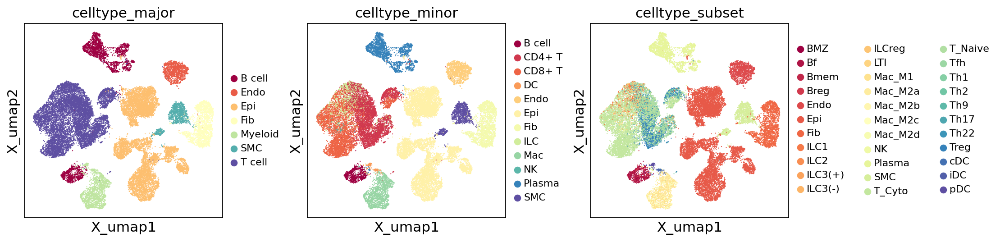

In [37]:
items_to_plot = ['celltype_major', # 'condition', 'sample', 
                 'celltype_minor', 'celltype_subset'] 

ws_hs = (0.3, 0.3)
sc.settings.set_figure_params(figsize=(3.5, 3.5), dpi=80, facecolor='white')
fig = sc.pl.embedding( adata, basis = 'X_umap', neighbors_key = 'neighbors',
                       color=items_to_plot, wspace = ws_hs[0], hspace = ws_hs[1], legend_fontsize = 10, 
                       ncols = 3, palette = 'Spectral', return_fig = True) #, add_outline = True) 

plt.show()

Major type/minor type annotation이 잘 되었는지 확인하기 위해 잘 알려진 마커들의 발현 패턴을 확인함

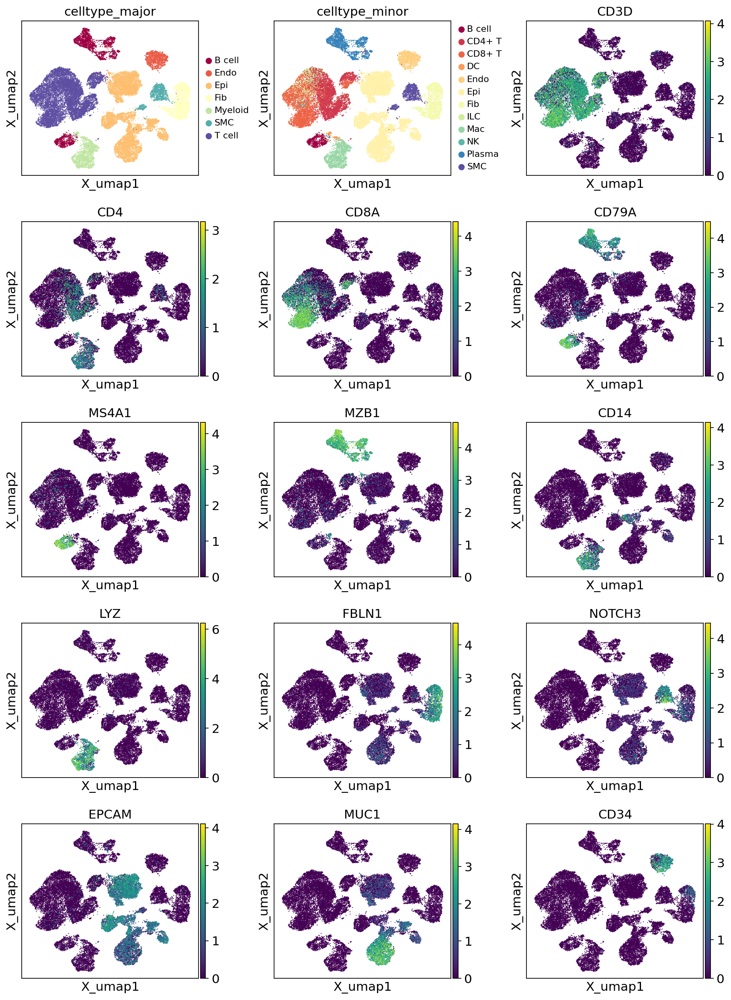

In [38]:
items_to_plot = ['celltype_major', 'celltype_minor']

genes = ['CD3D', 'CD4', 'CD8A', 'CD79A', 'MS4A1', 'MZB1', 
         'CD14', 'LYZ', 'FBLN1', 'NOTCH3', 'EPCAM', 'MUC1',  'CD34']

## 위 목록의 마커 유전자들 중 현재의 데이터에 있는 유전자들만 순서대로 선택 
genes_all = list(adata.var.index.values)
for g in genes:
    if g in genes_all:
        items_to_plot = items_to_plot + [g] 

ws_hs = (0.3, 0.3) ## subplot 간 수평/수직 방향의 공간 크기 설정
sc.settings.set_figure_params(figsize=(3.5, 3.5), dpi=80, facecolor='white')
fig = sc.pl.embedding( adata, basis = 'X_umap', neighbors_key = 'neighbors',
                       color=items_to_plot, wspace = ws_hs[0], hspace = ws_hs[1], legend_fontsize = 10, 
                       ncols = 3, palette = 'Spectral', return_fig = True) #, add_outline = True) 

plt.show()

#### __Subset marker expression pattern 확인__
- Subset annotation은 UMAP으로 확인하기 어려우므로 dot plot을 사용하여 확인
- dot의 크기는 annotation 결과 기준으로 해당 유형의 세포 중 얼마나 많은 비율이 해당 유정의 마커 유전자를 발현하고 있는지 보여줌


Num markers selected: 155 -> 100


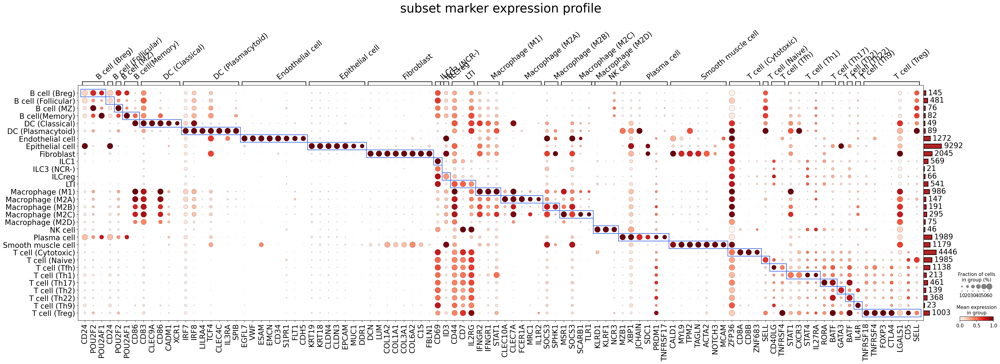

In [39]:
mkr_dict = copy.deepcopy( adata_t.uns['Celltype_marker_DB']['subset_markers_dict'] )
var_group_col = 'celltype_subset'
title = 'subset marker expression profile'

plot_marker_exp(  adata_t, markers = mkr_dict, 
                  var_group_col = var_group_col, group_col = None, 
                  title = title, title_y_pos = 1.3, title_fs = 30, 
                  text_fs = 18, linewidth = 1.5, standard_scale = 'var',
                  var_group_rotation = 40, var_group_height = 1.2, 
                  nz_frac_max = 0.6, nz_frac_cutoff = 0.05, 
                  rem_mkrs_common_in_N_groups_or_more = 3, N_cells_min = 20,
                  N_markers_per_group_max = 8, N_markers_total = 100, 
                  figsize = None, swap_ax = False, legend = True )


### __Celltype Population 확인__


,B cell,Dendritic cell,Endothelial cell,Epithelial cell,Fibroblast,ILC,Macrophage,NK cell,Plasma cell,Smooth muscle cell,T cell CD4+,T cell CD8+
ER+ CID3948,87,1,85,260,14,332,115,0,238,64,614,517
ER+ CID4067,52,4,184,2352,135,184,258,6,4,84,234,267
HER2+ CID3921,163,8,210,439,108,155,367,3,186,70,970,345
HER2+ CID4066,40,11,537,682,932,454,202,5,6,729,729,982
TNBC CID44971,371,110,217,1521,589,83,557,32,35,200,2242,2029
TNBC CID44991,71,8,39,4038,267,6,195,0,1520,32,541,306


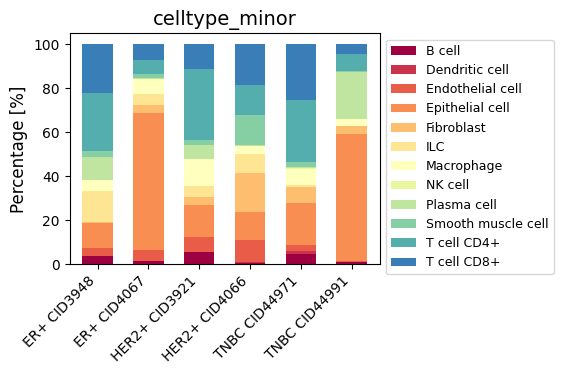

In [15]:
## 샘플별 세포 개수 및  상대비율을 얻어서 데이터프레임에 저장
celltype_col = 'celltype_minor' ## 세포 유형의 기준
df_cnt, df_pct= get_population( adata_t.obs['sample_rev'], 
                                adata_t.obs[celltype_col], sort_by = [] )
## 샘플별 세포 개수 확인
display(df_cnt)

plot_population( df_pct, bar_width = 0.6,
                 title = celltype_col, title_fs = 14, 
                 label_fs = 12, tick_fs = 10, xtick_rot = 45, xtick_ha = 'right',
                 legend_fs = 9, legend_loc = 'upper left', bbox_to_anchor = (1,1), 
                 legend_ncol = 1, cmap_name = None, figsize=(4, 3))

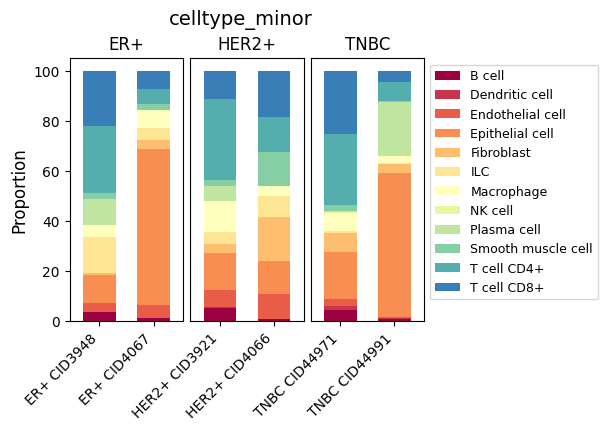

In [16]:
## 그룹별로 묶어서 barplot을 그리려면 샘플-그룹간 연결을 정의하는 dictionary를 가져와야 함. 
sample_group_map = get_sample_to_group_map(adata_t.obs['sample_rev'], adata_t.obs['condition'])
    
plot_population_grouped( df_pct, sample_group_map, sort_by = [], bar_width = 0.6,
                         title = celltype_col, title_fs = 14, title_y_pos = 1.12,
                         label_fs = 12, tick_fs = 10, xtick_rot = 45, xtick_ha = 'right',
                         legend_fs = 9, legend_loc = 'upper left', bbox_to_anchor = (1,1), 
                         legend_ncol = 1, cmap_name = None, figsize=(4, 3))

#### __특정 세포유형의 subset population 확인__

,Macrophage (M1),Macrophage (M2A),Macrophage (M2B),Macrophage (M2C),Macrophage (M2D)
ER+ CID3948,54,10,19,24,8
ER+ CID4067,107,39,36,52,24
HER2+ CID3921,227,25,42,66,7
HER2+ CID4066,125,11,19,39,8
TNBC CID44971,381,57,45,56,18
TNBC CID44991,92,5,30,58,10


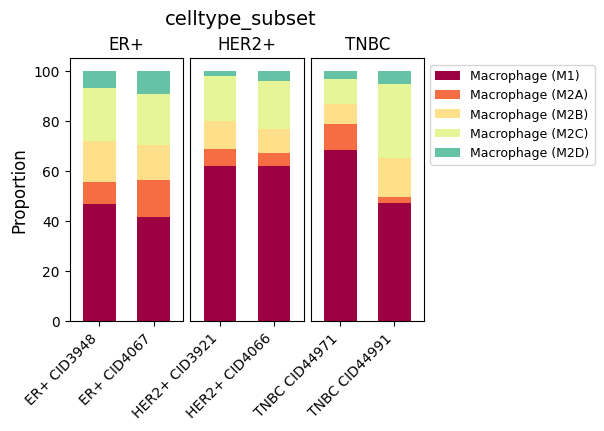

In [18]:
## 특정 세포유형의 subset별 상대비율을 얻기 위해 특정 세포 유형만 선택
## 이 경우 Macrophage subset의 상대비율을 보기 위해 먼저 minor type이 macrophage인 cell들만 선택
b = adata_t.obs['celltype_minor'] == 'Macrophage'
adata_s = adata_t[b,:]

## 샘플별로 macrophage subset의 개수와 상대비율을 얻어서 데이터프레임에 저장 
celltype_col = 'celltype_subset'
df_cnt, df_pct= get_population( adata_s.obs['sample_rev'], 
                                adata_s.obs[celltype_col], sort_by = [] )
display(df_cnt)

## 그룹별로 묶어서 barplot을 그리기 위해 샘플-그룹간 연결을 정의하는 dictionary를 가져옴. 
sample_group_map = get_sample_to_group_map(adata_t.obs['sample_rev'], adata_t.obs['condition'])
    
plot_population_grouped( df_pct, sample_group_map, sort_by = [], bar_width = 0.6,
                         title = celltype_col, title_fs = 14, title_y_pos = 1.12,
                         label_fs = 12, tick_fs = 10, xtick_rot = 45, xtick_ha = 'right',
                         legend_fs = 9, legend_loc = 'upper left', bbox_to_anchor = (1,1), 
                         legend_ncol = 1, cmap_name = None, figsize=(4, 3))

### __CNV & tumor cell identification 결과__ 
#### <font color=blue>(This works only if you checked "Tumor Identification" box when running SCODA)</font>

In [20]:
## InferCNV에 사용된 reference 세포 유형 확인
adata_t.uns['cnv_ref_celltypes']

array(['T cell', 'Fibroblast', 'Myeloid cell', 'B cell'], dtype=object)

#### CNV 패턴 확인

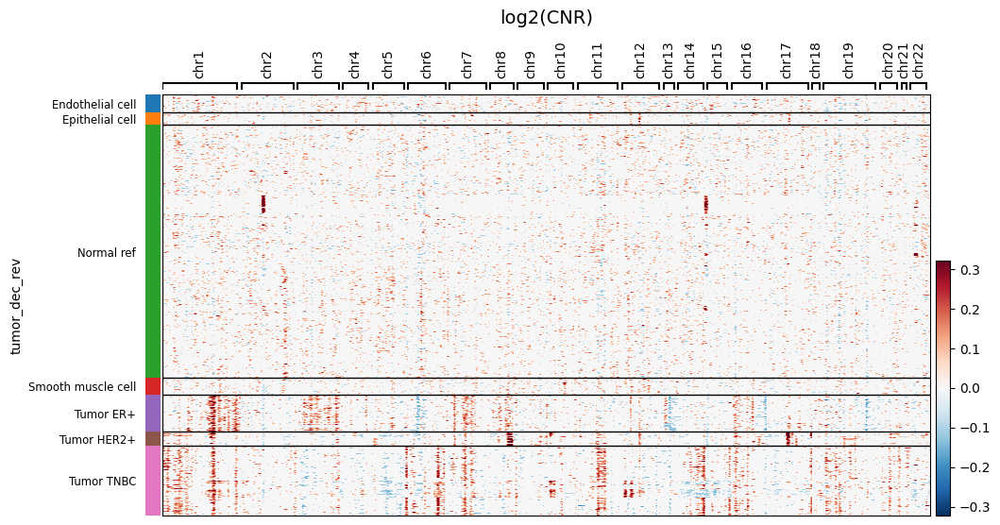

In [21]:
## adata_t의 사본을 만들어서 adata에 저장
## 이렇게하면 adata에 대해 처리한 내용이 원본에는 반영되지 않음
adata = adata_t[:,:]

## cell들을 Grouping 하기 위해 obs 필드에 'tumor_dec_rev' 열을 새로 정의
## 기본적으로 major type의 이름을 사용
adata.obs['tumor_dec_rev'] = adata.obs['celltype_major'].copy(deep = True).astype(str)

## InferCNV에 사용된 reference 세포 유형들은 'Normal ref'로 이름 변경
if 'cnv_ref_celltypes' in adata.uns.keys():
    b = adata.obs['tumor_dec_rev'].isin(adata.uns['cnv_ref_celltypes'])
    adata.obs.loc[b, 'tumor_dec_rev'] = 'Normal ref'

## condition 열에 정의된 유방암 subtype에 따라 암세포로 식별된 세포들의 이름에 유방암 subtype을 추가하여 이름 변경
## 예: condition이 ER+인 샘플중 Tumor cell들은 이름을 'Tumor ER+'로 변경 
cond_col = 'condition'
clst = adata.obs[cond_col].unique()
for c in clst:
    b = (adata.obs[cond_col] == c) & (adata.obs['tumor_dec'] == 'Tumor')
    s = 'Tumor %s' % c
    adata.obs.loc[b, 'tumor_dec_rev'] = s

## 'tumor_dec_rev'열 기준으로 Grouping하여 각 그룹별 CNV 패턴을 비교
axd = plot_cnv( adata, groupby = 'tumor_dec_rev', 
                title = 'log2(CNR)', title_fs = 14, title_y_pos = 1.15, 
                figsize = (11, 6), swap_axes = False, 
                var_group_rotation = 90, cmap='RdBu_r', vmax = 1)

#### Tumor cell로 식별된 세포들만 골라서 샘플별로 CNV 패턴 비교

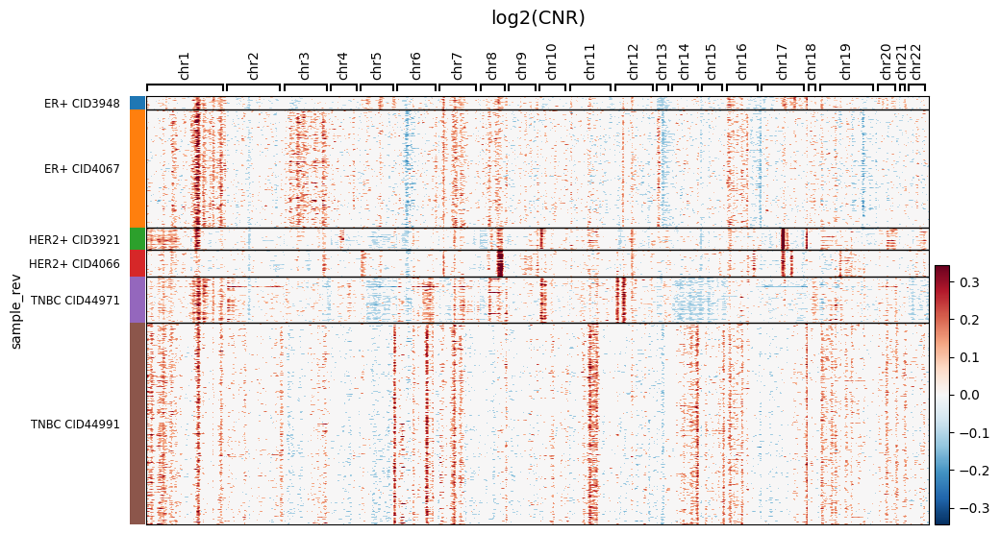

In [22]:
## adata의 cell들 중 tumor cell들만 골라서 adata2에 저장
b = (adata.obs['tumor_dec'] == 'Tumor')
adata2 = adata[b,:]

## 'sample_rev'열 기준으로 Grouping하여 각 그룹별 CNV 패턴을 비교
plot_cnv( adata2, groupby = 'sample_rev', 
                title = 'log2(CNR)', title_fs = 14, title_y_pos = 1.15, 
                figsize = (11, 6), swap_axes = False, 
                var_group_rotation = 90, cmap='RdBu_r', vmax = 1)

#### CNV 패턴을 UMAP 차원 축소하여 확인

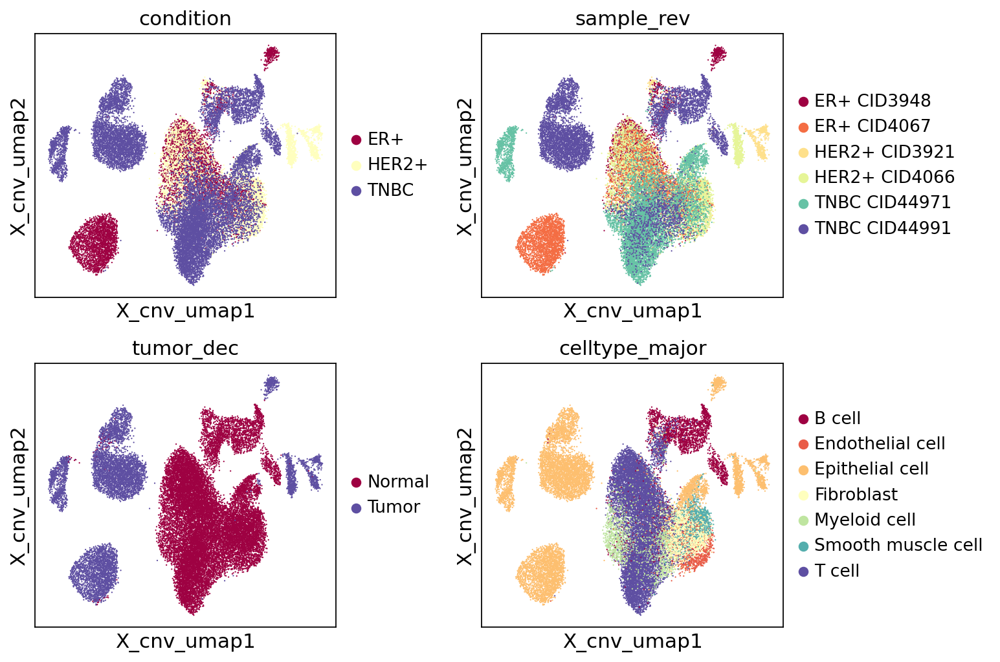

In [53]:
items_to_plot = ['condition', 'sample_rev', 'tumor_dec', 'celltype_major'] 

adata = adata_t[:,:]

ad_tmp = sc.tl.umap(adata, neighbors_key = 'cnv_neighbors_info', copy = True)   
adata.obsm['X_cnv_umap'] = ad_tmp.obsm['X_umap']

sc.settings.set_figure_params(figsize=(3.5, 3.5), dpi=80, facecolor='white')
fig = sc.pl.embedding( adata, basis = 'X_cnv_umap', neighbors_key = 'cnv_neighbors',
                       color=items_to_plot, wspace = 0.35, legend_fontsize = 12, ncols = 2, 
                       palette = 'Spectral', return_fig = False) #, add_outline = True) 
plt.show()

### __Cell-cell interaction 분석결과__ 
- 샘플별 CCI 결과와 조건별 CCI 결과가 따로 저장되어 있음
- 데이터 포맷은 두 결과가 동일함
- 조건별 CCI는 해당 조건에 포함된 샘플중 일정 퍼센트 이상의 샘플에서 공통적으로 확인된 것들만 추린 것임.

In [24]:
## 조건 별 CCI 결과
df_dct = adata_t.uns['CCI']
df_dct.keys()

dict_keys(['ER+', 'HER2+', 'TNBC'])

In [25]:
## 샘플 별 CCI 결과
df_dct = adata_t.uns['CCI_sample']
df_dct.keys()

dict_keys(['ER+ CID3948', 'ER+ CID4067', 'HER2+ CID3921', 'HER2+ CID4066', 'TNBC CID44971', 'TNBC CID44991'])

In [26]:
## CCI 결과의 형식
adata_t.uns['CCI']['ER+'].head()

,gene_pair,cell_pair,gene_A,gene_B,cell_A,cell_B,pval,mean
ADM_RAMP3--Endothelial cell|Endothelial cell,ADM_RAMP3,Endothelial cell|Endothelial cell,ADM,RAMP3,Endothelial cell,Endothelial cell,0.0,0.9775
ADM_RAMP3--Endothelial cell|Epithelial cell,ADM_RAMP3,Endothelial cell|Epithelial cell,ADM,RAMP3,Endothelial cell,Epithelial cell,0.0,0.2180
ADM_RAMP3--Macrophage|Endothelial cell,ADM_RAMP3,Macrophage|Endothelial cell,ADM,RAMP3,Macrophage,Endothelial cell,0.0,1.0895
ADM_RAMP3--Macrophage|Epithelial cell,ADM_RAMP3,Macrophage|Epithelial cell,ADM,RAMP3,Macrophage,Epithelial cell,0.0,0.3300
ADORA3_ENTPD1--Macrophage|Endothelial cell,ADORA3_ENTPD1,Macrophage|Endothelial cell,ADORA3,ENTPD1,Macrophage,Endothelial cell,0.0,0.2110


#### __cell-cell interactions per sample__

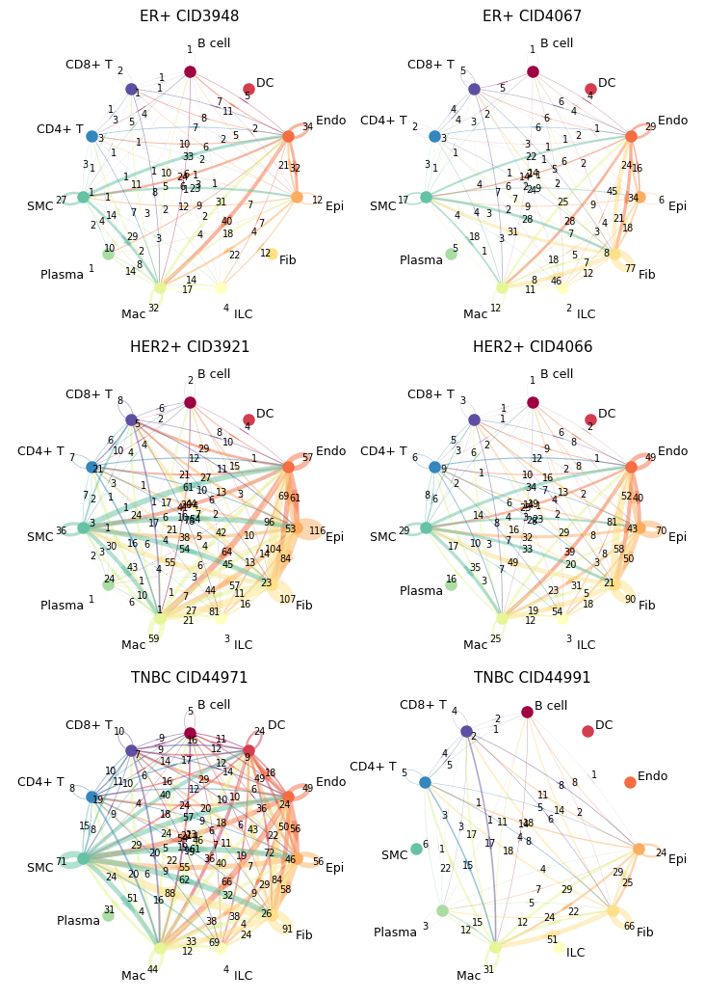

In [29]:
cci_target = 'CCI_sample'

## DataFrame들의 dictionalry로 되어 있는 CCI 결과를 가져옴
df_dct = adata_t.uns[cci_target]

## Circle plot을 그리기 위해 celltype간 interaction의 개수를 나타내는 행렬(DataFrame)을 얻되
## 모든 샘플에서 공통적으로 나타나는 CCI들은 빼고 count 함
df_lst = cci_get_ni_mat( df_dct, remove_common = True )

## 세포 유형 이름을 약어로 대치
lst = ['Epithelial cell', 'T cell CD4+', 'T cell CD8+', 'Smooth muscle cell', 'Fibroblast', 'ILC', 
       'Dendritic cell', 'Monocyte', 'Endothelial cell', 'Macrophage', 'B cell', 'Plasma cell', 'NK cell']
lst2 = ['Epi', 'CD4+ T', 'CD8+ T', 'SMC', 'Fib', 'ILC', 'DC', 'Mono', 'Endo', 'Mac', 'B cell', 'Plasma', 'NK']
rend = dict(zip(lst, lst2))
## display(rend)

for k in df_lst.keys():
    df_lst[k].rename(columns = rend, index = rend, inplace = True)

plot_cci_circ_group( df_lst, ncol = 2, figsize = (3.5,3.5), 
                     title = None, title_y_pos = 1.1, title_fs = 24, 
                     text_fs = 9, num_fs = 7, margin = 0.08, alpha = 0.5, 
                     R_curvature = 3, linewidth_max = 8, linewidth_log = False, 
                     node_size = 8, rot = False, cmap = 'Spectral', 
                     wspace = 0.15, hspace = 0.1 )

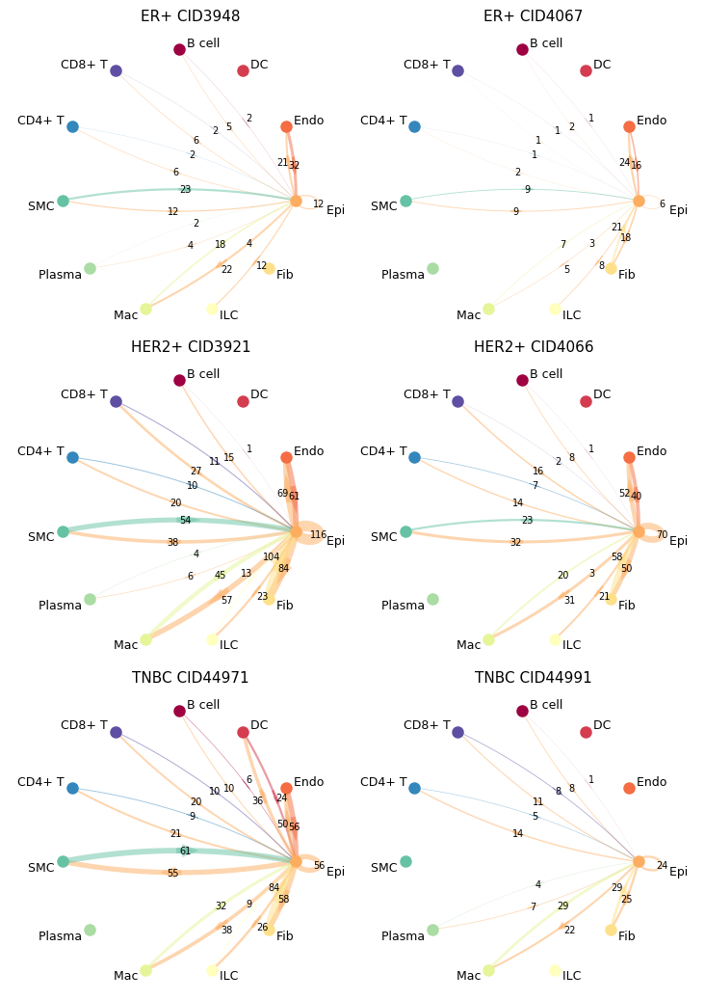

In [30]:
## 특정 세포유형을 중심으로 CCI 개수 확인 (이 경우 Epithelial cell을 중심으로 봄)
target = 'Epi'
df_lst2 = {}
for key in df_lst.keys():
    df = df_lst[key]
    msk = df.copy(deep = True)
    msk.loc[:,:] = 0
    msk.loc[target,:] = 1
    msk.loc[:,target] = 1
    df_lst2[key] = df*msk
    
plot_cci_circ_group( df_lst2, ncol = 2, figsize = (3.5,3.5), title = None, title_y_pos = 1.1, 
                 title_fs = 24, text_fs = 9, num_fs = 7, margin = 0.08, alpha = 0.5, 
                 R_curvature = 3, linewidth_max = 8, linewidth_log = False, 
                 node_size = 8, rot = False, cmap = 'Spectral', 
                 wspace = 0.15, hspace = 0.1 )

#### __각 샘플(조건)별 상세 내용__

13 cell_pairs, 23 gene_pairs found


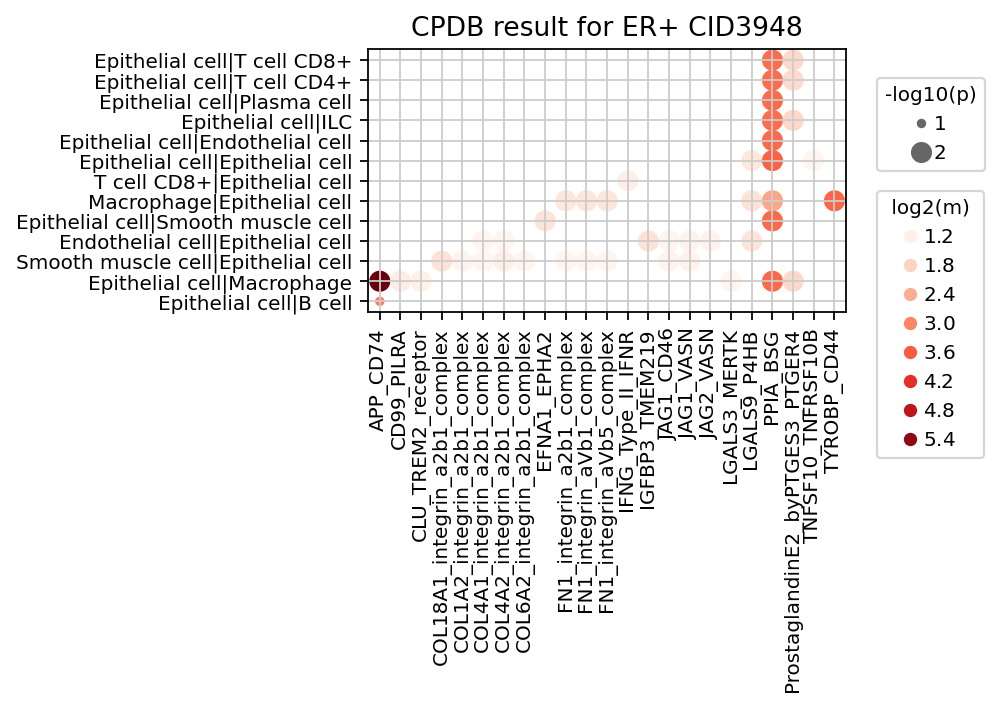

12 cell_pairs, 16 gene_pairs found


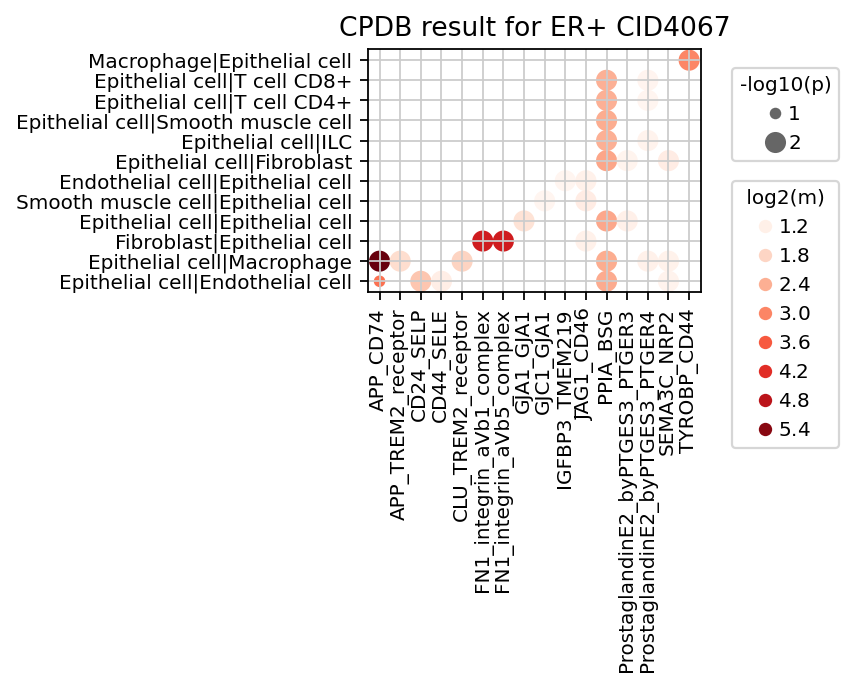

18 cell_pairs, 155 gene_pairs found


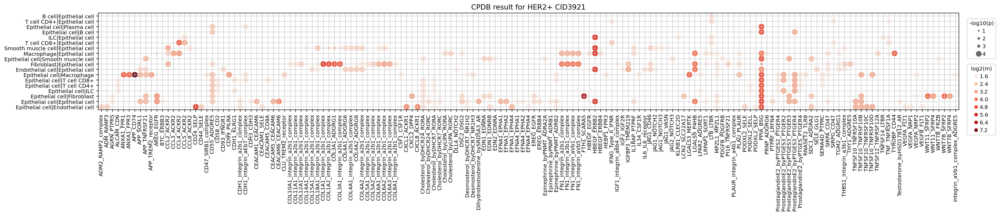

17 cell_pairs, 68 gene_pairs found


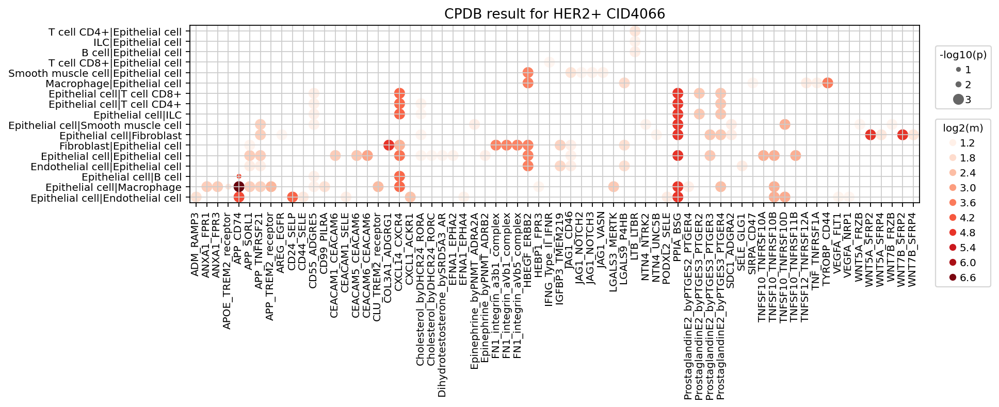

19 cell_pairs, 98 gene_pairs found


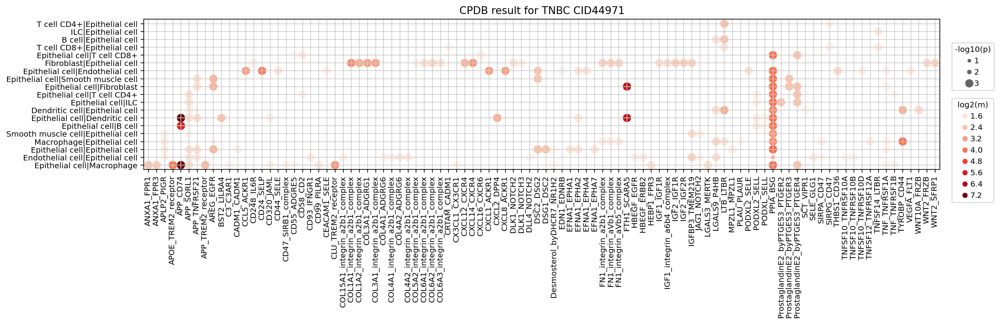

11 cell_pairs, 31 gene_pairs found


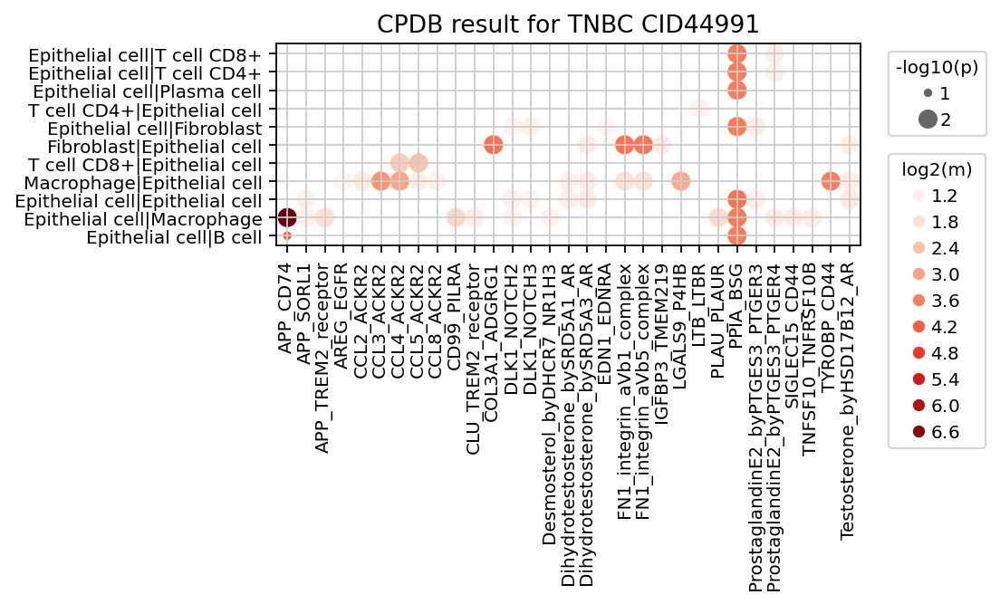

In [32]:
## p-value와 mean값의 cutoff를 정의하여 필터링하고
## 특정 target cell이 포함된 interaction들만 확인함. (모든 CCI를 다 보려면 target_cells을 []로 설정)
pval_cutoff = 0.05
mean_cutoff = 1 
target_cells = ['Epithelial cell']

## 위 조건에 맞는 CCI들만 선택하여 df_dct_to_plot에 저장
df_dct_to_plot = {}
for key in df_dct.keys():
    df = df_dct[key]
    b1 = df['pval'] <= pval_cutoff
    b2 = df['mean'] >= mean_cutoff
    if (target_cells is not None) & (len(target_cells) > 0):
        b3 = df['cell_A'].isin(target_cells) | df['cell_B'].isin(target_cells)
    df_dct_to_plot[key] = df.loc[b1&b2&b3, :]

## 각 샘플별(조건별)로 CCI 확인
for g in df_dct_to_plot.keys():
    
    dfv = df_dct_to_plot[g]
    idxs = list(dfv.index.values)
    
    dfs = dfv.sort_values(by = ['gene_pair', 'cell_pair'])
    
    if dfs.shape[0] > 0:
        ax = plot_cci_dot( dfs, 
                           title = 'CPDB result for %s' % g, title_fs = 12, 
                           legend_fs = 9, legend_mkr_sz = 9, 
                           tick_fs = 9, xtick_rot = 90, xtick_ha = 'center',
                           dpi = 80, swap_ax = True )

#### __CCI mean difference between conditions__
샘플별 CCI 결과에서 모든 샘플에서 공통적으로 확인된 CCI를 골라서 \
각 조건별로 상호작용의 강도간 유의한 차이가 있는지 확인할 수 있음

,TYROBP_CD44 \nMacrophage|T cell CD4+,CD55_ADGRE5 \nEpithelial cell|T cell CD4+,HLA-F_LILRB2 \nT cell CD4+|Macrophage,HEBP1_FPR3 \nEpithelial cell|Macrophage,TYROBP_CD44 \nMacrophage|B cell
ER+ CID3948,9.812000,0.439,0.434,0.896,9.870
ER+ CID4067,6.486000,0.400,0.175,0.325,6.309
HER2+ CID3921,22.004999,3.656,0.859,1.553,21.837
HER2+ CID4066,11.512000,1.293,0.420,1.081,11.307
TNBC CID44971,15.075000,0.822,0.826,2.248,14.880
TNBC CID44991,10.761000,0.719,0.505,0.822,10.729


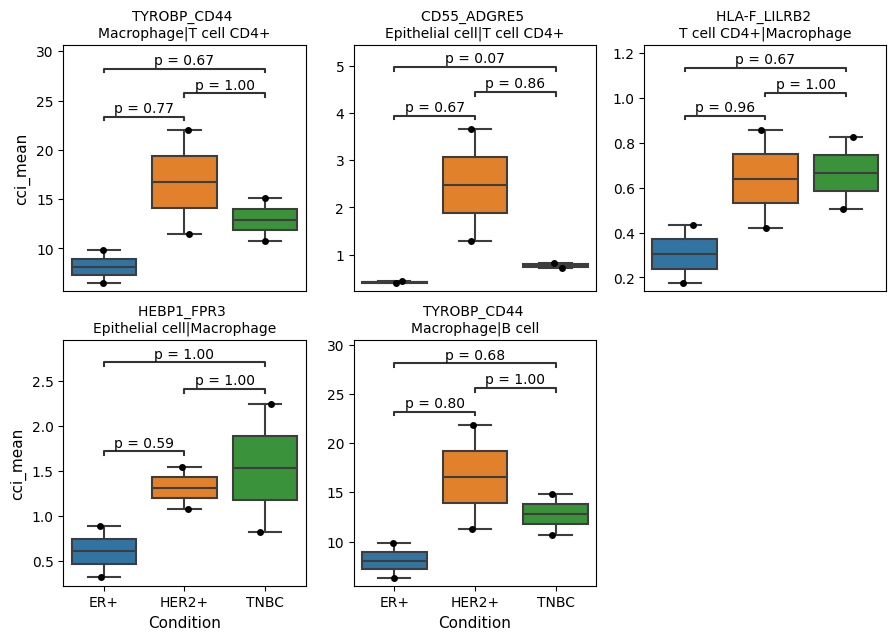

In [6]:
cci_df_dct = adata_t.uns['CCI_sample']

## get coomon cci index
for j, key in enumerate(cci_df_dct.keys()):
    if j == 0: idx_common = list(cci_df_dct[key].index.values)
    else: idx_common = list(set(idx_common).intersection(list(cci_df_dct[key].index.values)))

## mean 값을 가져오된 pval가 cutoff 보다 작은 것들만 가져옴
df = cci_get_means( cci_df_dct, cci_idx_lst = idx_common, pval_cutoff = 0.05 )
## cci_idx_lst를 None으로 설정하면 cci_df_dct에 있는 모든 CCI들의 union에 대한 결과를 리턴함 (pval_cutoff은 적용됨)
## 리턴 결과가 0인 것은 해당 샘플에서 해당 CCI가 검출되지 않은 것임.

## CCI index는 (gene pair)--(cell pair)로 정의되어 문자열이 길므로 '--'을 공백으로 대치하여 줄바꿈 되도록 변경함
idx = list(df.columns.values)
idx_new = [s.replace('--', ' \n') for s in idx]
rend = dict(zip(idx, idx_new))
df.rename(columns = rend, inplace = True)

display(df.iloc[:, :5])

## 조건별 mean 값의 차이에 대한 통계적 유의성 확인을 위해 각 sample에대한 condition을 알려주어야 함.
sample_group_map = get_sample_to_group_map(adata_t.obs['sample_rev'], adata_t.obs['condition'])

## Show the first 5 CCIs
plot_pct_box(df.iloc[:, :5], sample_group_map, ylabel = 'cci_mean', 
             ncols = 3, figsize = (3,3), dpi = 100,
             title = None, title_y_pos = 1.05, title_fs = 12, 
             label_fs = 11, tick_fs = 10, tick_rot = 0, 
             annot_ref = None, annot_fmt = 'simple', annot_fs = 10, 
             ws_hs = (0.2, 0.2), stripplot = True)

### __DEG 분석결과__ 
- DEG 결과는 각 세포 유형별로 처리되어 저장됨
- major, minor, subset 중 어느 수준을 기준으로 할지는 analysis_parameters에서 정의 할 수 있음
- 현재의 결과는 celltype_minor 기준으로 세포 유형별로 condition-specific DEG를 얻은 결과 임.

In [11]:
nc_deg_dct = adata_t.uns['DEG_stat'] ## DEG 분석에 사용된 셀수 정보
df_deg_dct = adata_t.uns['DEG'] ## DEG 분석 결과

## 어떤 세포 유형들에 대한 DEG 결과가 있는지 확인 
df_deg_dct.keys()

## analysis_parameters에 정의한 DEG분석을 위한 최소 셀수(MIN_NUM_CELLS_FOR_DEG)보다 
## 적은 셀수를 갖는 세포 유형에 대해서는 DEG 분석이 수행 되지 않음. 
## (각 조건 별로 해당 유형의 셀수가 최소한 MIN_NUM_CELLS_FOR_DEG 정도되어야 DEG 분석이 수행됨)

dict_keys(['B cell', 'Endothelial cell', 'Epithelial cell', 'Fibroblast', 'Macrophage', 'Plasma cell', 'Smooth muscle cell', 'T cell CD4+', 'T cell CD8+'])

In [12]:
## 특정 세포 유형에 대한 DEG 분석 결과를 가져옴 (이경우 Epithelial cell)
target_cell = 'Epithelial cell'

df_deg = df_deg_dct[target_cell]
nc_deg = nc_deg_dct[target_cell]

## 해당 세포 유형에 사용된 조건 별 셀수 확인
nc_deg

{'ER+_vs_others': {'ER+': 780, 'others': 1999},
 'HER2+_vs_others': {'HER2+': 959, 'others': 1820},
 'TNBC_vs_others': {'TNBC': 1040, 'others': 1739}}

In [14]:
df_deg['ER+_vs_others'].head()
## Rp는 해당 조건의 샘플중에서 해당 유전자가 minimun fraction이상 발현된 샘플의 비율임

,log2_FC,pval,pval_adj,mean_test,mean_ref,nz_pct_test,nz_pct_ref,nz_pct_score,Rp
ESR1,6.839,2.629367e-289,3.048751e-285,2.500025,0.093206,0.861538,0.077039,0.733908,1.0
RP11-53O19.1,6.816,1.686961e-167,1.956031e-163,1.580981,0.033684,0.624359,0.037019,0.578989,1.0
STC2,5.085,5.680097e-166,6.586073e-162,2.062265,0.184184,0.703846,0.110555,0.556821,1.0
PIP,6.021,6.307101e-217,7.313084e-213,3.445383,0.383568,0.829487,0.186093,0.549489,1.0
SUSD3,5.247,9.280712e-131,1.076099e-126,1.283706,0.066491,0.576923,0.060030,0.509737,1.0


B cell


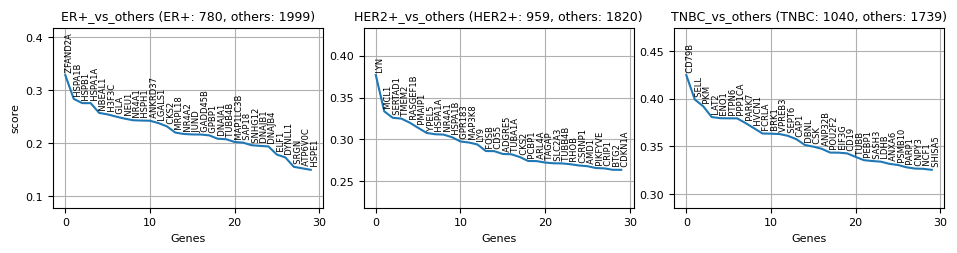

Endothelial cell


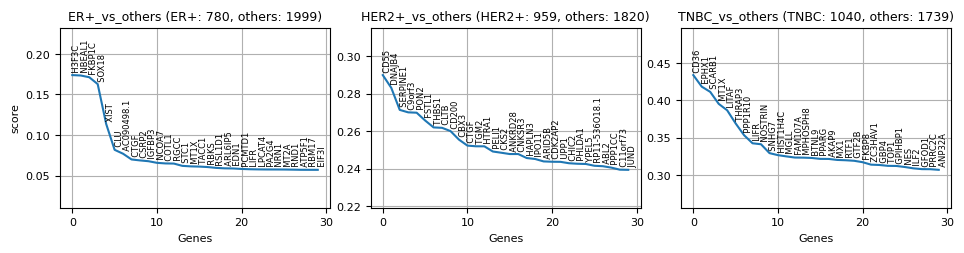

Epithelial cell


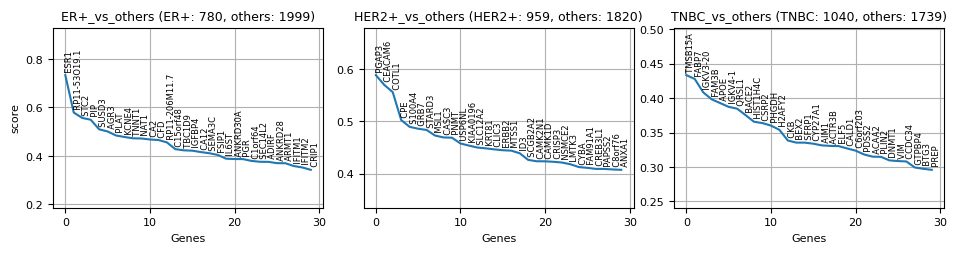

Fibroblast


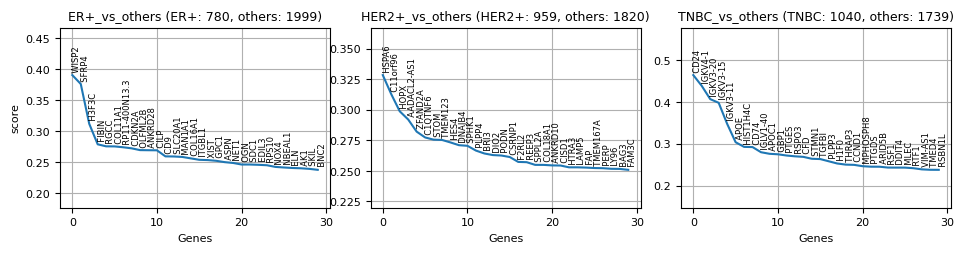

Macrophage


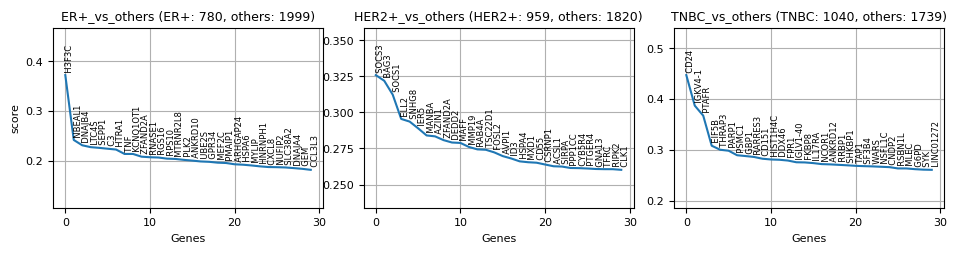

Plasma cell


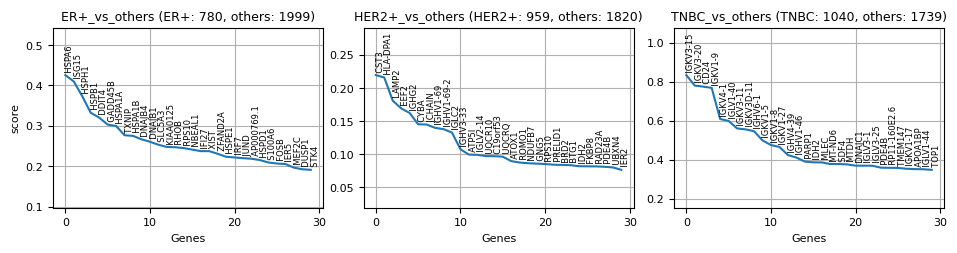

Smooth muscle cell


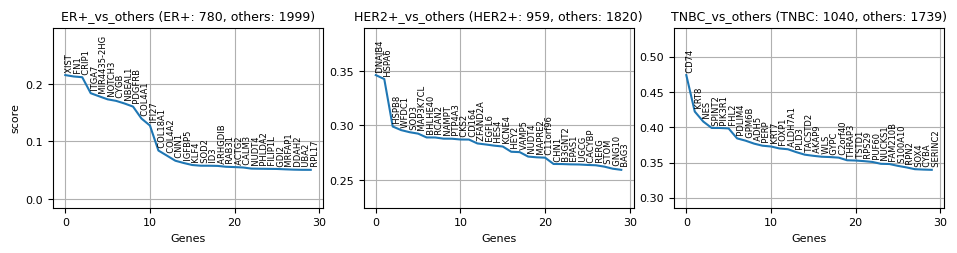

T cell CD4+


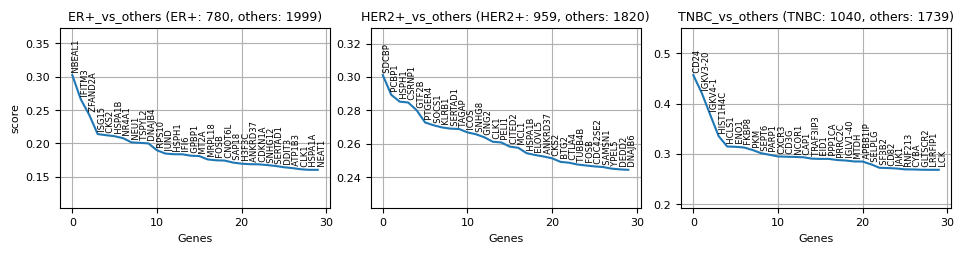

T cell CD8+


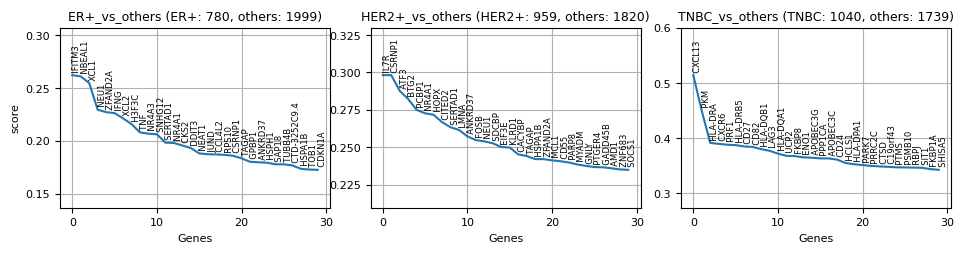

In [15]:
n_genes_to_show = 30

for key in df_deg_dct.keys():
    df_deg = df_deg_dct[key]
    for k in df_deg.keys():
        df_deg[k]['score'] = df_deg[k]['nz_pct_score']*df_deg[k]['Rp']

    print(key)
    plot_deg( df_deg, reference = 'score', n_genes_to_show = n_genes_to_show, pval_cutoff = 0.05, 
              figsize = (3.3,2), text_fs = 6, title_fs = 9, label_fs = 8, 
              tick_fs = 8, ncols = 3, wspace = 0.15, hspace = 0.2, 
              deg_stat_dct = nc_deg, show_log_pv = False )


### __Discovery of condition-specific markers (per minor celltype)__

In [16]:
nc_deg_dct = adata_t.uns['DEG_stat']
df_deg_dct = adata_t.uns['DEG']
df_deg_dct.keys()

dict_keys(['B cell', 'Endothelial cell', 'Epithelial cell', 'Fibroblast', 'Macrophage', 'Plasma cell', 'Smooth muscle cell', 'T cell CD4+', 'T cell CD8+'])

In [20]:
## Select celltype to explore
target_cell, ref_col = 'Epithelial cell', 'celltype_minor'
# target_cell, ref_col = 'Macrophage', 'celltype_minor'
# target_cell, ref_col = 'Fibroblast', 'celltype_minor'

df_deg = df_deg_dct[target_cell]
nc_deg = nc_deg_dct[target_cell]

subtype_mkr_dict = get_markers_from_deg( df_deg, N_mkrs = 30, ref_col = 'score', 
                                         nz_pct_test_min = 0.5, 
                                         nz_pct_ref_max = 0.4, 
                                         rem_common = False )

## Print results   
for key in subtype_mkr_dict.keys():
    subtype_mkr_dict[key].sort()
    print('%s (%i): ' % (key, len(subtype_mkr_dict[key])), subtype_mkr_dict[key])        


ER+ (30):  ['ADIRF', 'AGR3', 'ANKRD28', 'ANKRD30A', 'ARMT1', 'C15orf48', 'CA12', 'CA2', 'CFD', 'CRIP1', 'CYP4X1', 'ESR1', 'FSIP1', 'IFITM1', 'IFITM2', 'IGFBP4', 'IL6ST', 'KCNE4', 'NAT1', 'PIP', 'PLAT', 'RP11-206M11.7', 'RP11-53O19.1', 'SEMA3C', 'SIAH2', 'STC2', 'SUSD3', 'TBC1D9', 'TNNT1', 'XIST']
HER2+ (30):  ['ANXA1', 'C8orf76', 'CAMK2N1', 'CASC3', 'CEACAM6', 'CLIC3', 'COTL1', 'CPE', 'CREB3L1', 'CYBA', 'ERBB2', 'FAM91A1', 'GRB7', 'HIF1A', 'ID3', 'KIAA0196', 'KRT23', 'LMTK3', 'MED24', 'MGLL', 'MSL1', 'MTSS1', 'NSMCE2', 'PAPSS2', 'PGAP3', 'S100A4', 'SCGB2A2', 'SLC12A2', 'STARD3', 'USP6NL']
TNBC (30):  ['ATG5', 'BACE2', 'BTG3', 'C20orf27', 'C6orf203', 'CD82', 'DBN1', 'DEK', 'DNMT1', 'DNPEP', 'DSC2', 'DTYMK', 'GTPBP4', 'H2AFY2', 'HIST1H4C', 'ID2', 'KLHDC3', 'LDHB', 'LMO4', 'MAD2L2', 'MARCKS', 'NASP', 'NFIB', 'ODF2L', 'PHGDH', 'PPP1R7', 'QRSL1', 'SF3A2', 'TPGS2', 'WIPI2']


N_samples:  6 ave. N_cells:  1548.6666666666667
Num markers selected: 54 -> 54


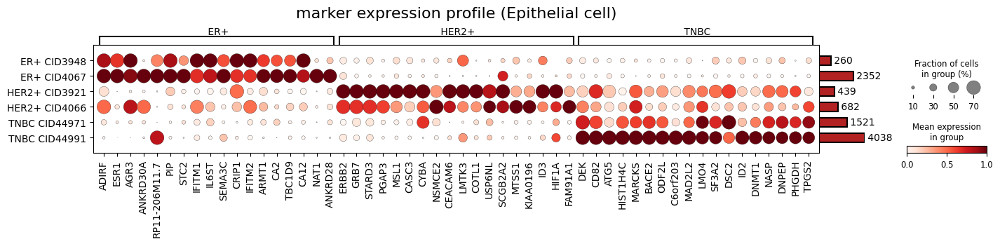

In [22]:
adata_s = adata_t[:,:]

## UMAP with celltype annotation, sample, condition
sc.pp.normalize_total(adata_s, target_sum=1e4)
sc.pp.log1p(adata_s)

b = adata_s.obs[ref_col] == target_cell
adata_s = adata_s[b,:]

group_col = 'sample_rev'

## Select samples with its No. of cells greater than 40
pcnt = adata_s.obs[group_col].value_counts()
b = pcnt >= 20
plst = list(pcnt.index.values[b])

# display(pcnt[plst])
print('N_samples: ', len(plst), 'ave. N_cells: ', pcnt[plst].mean())

b = adata_s.obs[group_col].isin(plst)
adata_ss = adata_s[b,:]

title = 'marker expression profile (%s)' % target_cell
plot_marker_exp(  adata_ss, markers = subtype_mkr_dict, var_group_col = cond_col, group_col = group_col, 
                  title = title, title_y_pos = 1.2, title_fs = 16, text_fs = 10, linewidth = 1.5, 
                  standard_scale = 'var', var_group_rotation = 0, var_group_height = 1.2, 
                  nz_frac_max = 0.7, nz_frac_cutoff = 0.05, rem_mkrs_common_in_N_groups_or_more = 0, N_cells_min = 20,
                  N_markers_per_group_max = 18, N_markers_total = 200, figsize = (16,2), swap_ax = False, legend = True)

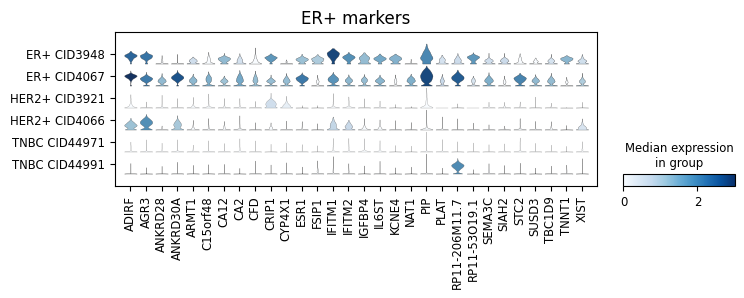

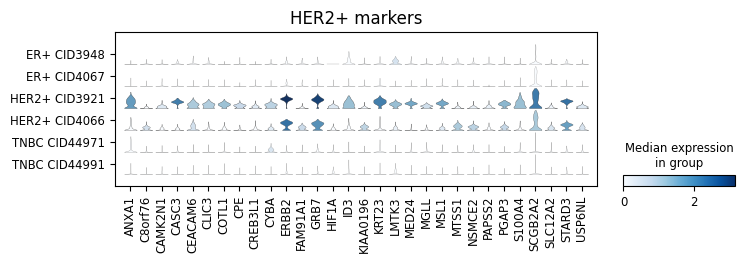

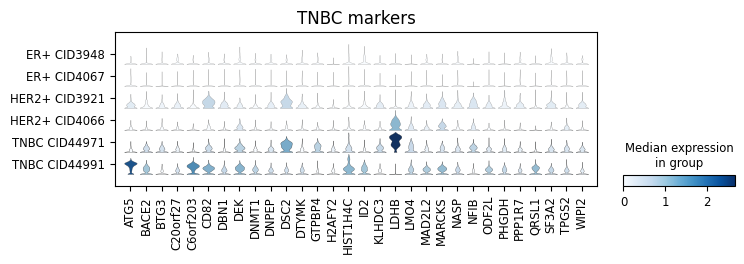

In [23]:
for k, key in enumerate(list(subtype_mkr_dict.keys())):
    items_to_plot = subtype_mkr_dict[key]
    sc.pl.stacked_violin(adata_ss, items_to_plot, groupby= group_col, title = '%s markers' % key, rotation=90, 
                         swap_axes = False, figsize = (8,2))
plt.show()

#### 특정 마커들에 대한 violin plot 확인

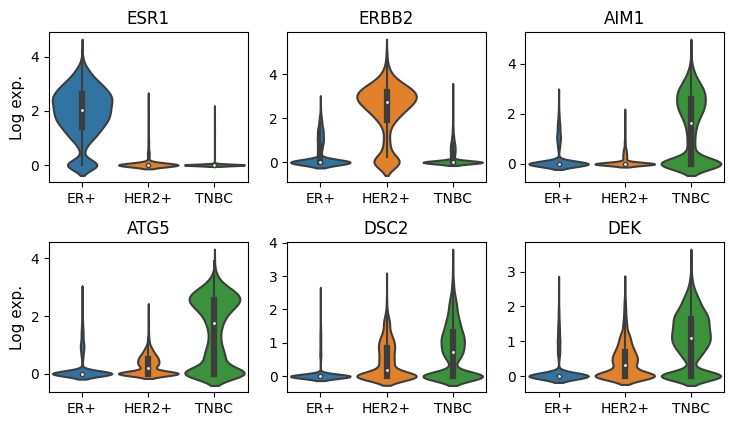

In [24]:
items_to_plot = ['ESR1', 'ERBB2', 'AIM1', 'ATG5', 'DSC2', 'DEK']

df = adata_ss[:, items_to_plot].to_df()
df['group'] = adata_ss.obs['condition']
plot_violin( df, genes_lst = items_to_plot, group_col = 'group', scale = 'width', 
             group_order = None, inner = 'box', width = 0.9, linewidth = 0.3, bw = 'scott', 
             figsize = (2.5,2), text_fs = 10, title = None, title_fs = 14, title_y_pos = 1, 
             label_fs = 11, tick_fs = 10, tick_rot = 0, tick_ha = 'center', 
             ncols = 3, wspace = 0.2, hspace = 0.4 )

### __GSA 분석결과__

In [26]:
gsa_res_up = adata_t.uns['GSA_up']
gsa_res_dn = adata_t.uns['GSA_down']

gsa_res_up.keys()

dict_keys(['B cell', 'Endothelial cell', 'Epithelial cell', 'Fibroblast', 'Macrophage', 'Plasma cell', 'Smooth muscle cell', 'T cell CD4+', 'T cell CD8+'])

In [29]:
gsa_res = gsa_res_up

gsa_keys = list(gsa_res[target_cell].keys())
display(gsa_keys)

['ER+_vs_others', 'HER2+_vs_others', 'TNBC_vs_others']

In [ ]:
## GSA 결과의 포맷 확인
gsa_res[target_cell][gsa_keys[0]]

#### __특정 세포 유형에 대한 GSA 결과 확인__

['ER+_vs_others', 'HER2+_vs_others', 'TNBC_vs_others']

,pval,pval_adj,overlap,pw_size,-log(p-val),-log(q-val),Ind
AMPK signaling pathway,0.067656,1.0,23,120,1.169695,0.0,1
Alzheimer disease,0.086319,1.0,61,369,1.063894,0.0,1
Amyotrophic lateral sclerosis,0.092045,1.0,60,364,1.035998,0.0,1
Apoptosis,0.085779,1.0,26,142,1.066621,0.0,1
Axon guidance,0.096058,1.0,32,182,1.017465,0.0,1


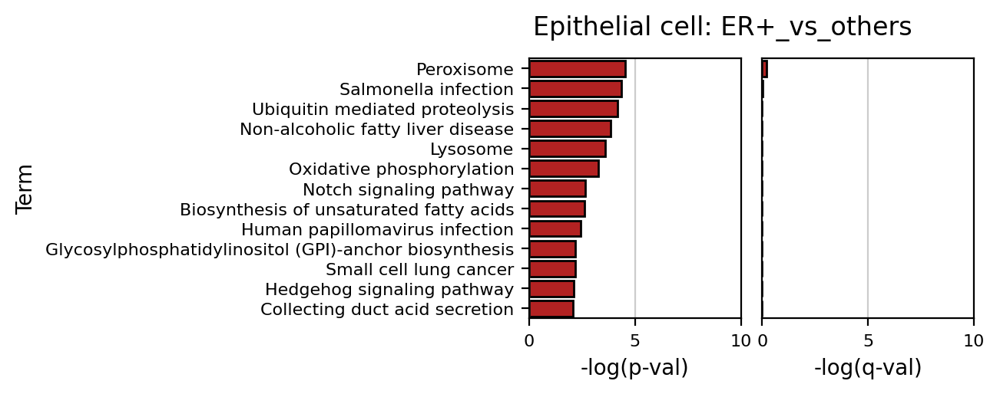

,pval,pval_adj,overlap,pw_size,-log(p-val),-log(q-val),Ind
AGE-RAGE signaling pathway in diabetic complications,3.665711e-02,1.000000,29,100,1.435842,0.000000,1
AMPK signaling pathway,5.464008e-02,1.000000,33,120,1.262489,0.000000,1
Adherens junction,1.689419e-02,1.000000,23,71,1.772263,0.000000,1
Alzheimer disease,8.778990e-07,0.018890,117,369,6.056555,1.723774,1
Amyotrophic lateral sclerosis,2.168591e-09,0.000047,125,364,8.663822,4.331041,1


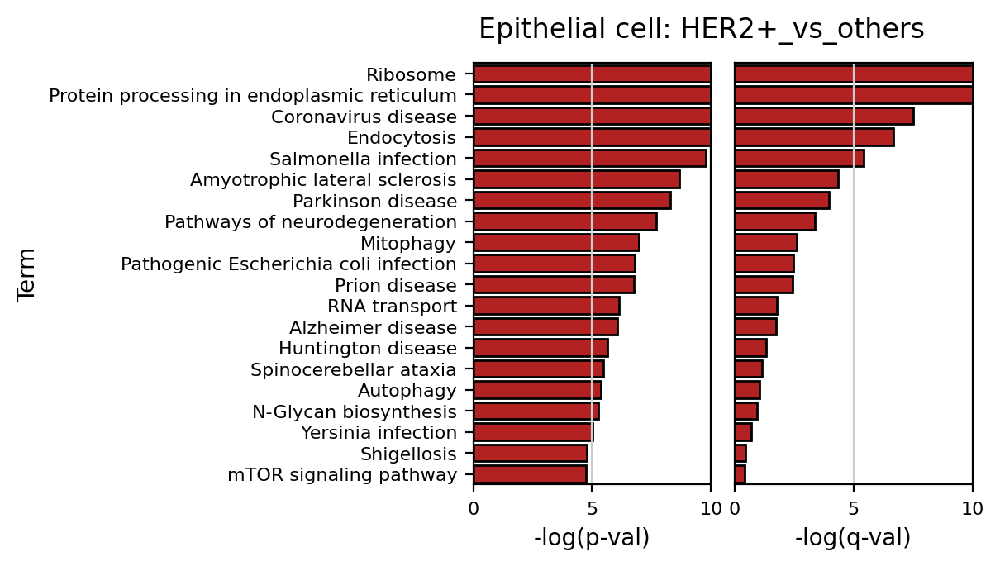

,pval,pval_adj,overlap,pw_size,-log(p-val),-log(q-val),Ind
Acute myeloid leukemia,5.447218e-03,1.000000,25,67,2.263825,0.000000,1
Adherens junction,6.185237e-03,1.000000,26,71,2.208644,0.000000,1
Alzheimer disease,2.573585e-06,0.055376,123,369,5.589461,1.256680,1
Amino sugar and nucleotide sugar metabolism,6.470525e-02,1.000000,16,48,1.189060,0.000000,1
Amyotrophic lateral sclerosis,5.380714e-10,0.000012,135,364,9.269160,4.936378,1


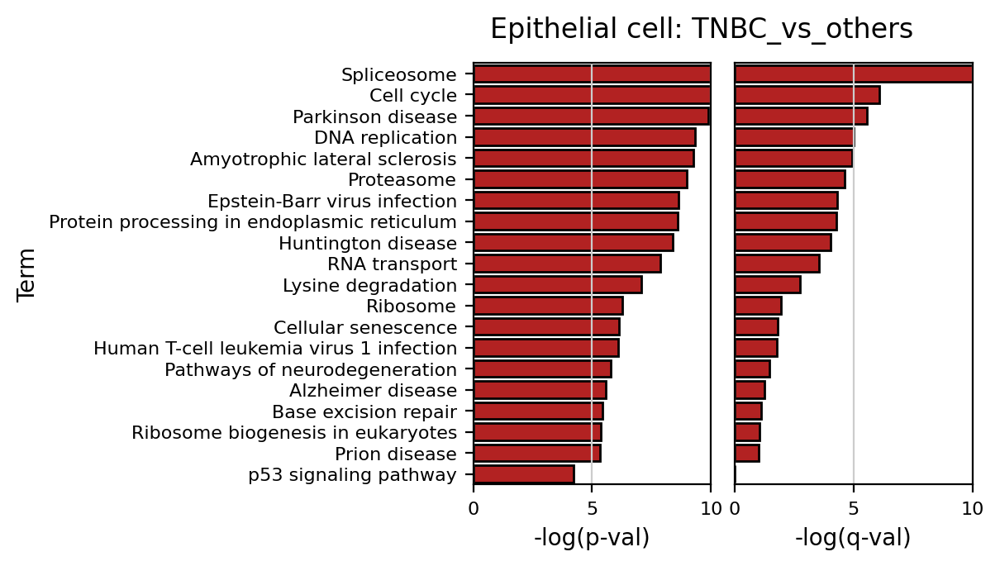

In [28]:
target_cell = 'Epithelial cell'

items_to_plot = ['-log(p-val)', '-log(q-val)'] 
lims = [[0, 10], [0, 10]] 
N_max_to_show = 20
neg_log_p_cutoff = 2 ## p-value cutoff = 0.01

for target_cond in gsa_keys:
    
    df_res_gsa = gsa_res[target_cell][target_cond]
    
    ## GSA 결과의 포맷 확인
    display(df_res_gsa.drop(columns = ['genes', 'Term']).head())

    ## p-value cutoff 조건에 맞는 term들만 선택
    df_res = df_res_gsa.copy(deep = True)
    df_res = df_res.loc[df_res['-log(p-val)'] >= neg_log_p_cutoff ]
    df_res = df_res.sort_values(by = '-log(p-val)', ascending = False).iloc[:min(df_res.shape[0], N_max_to_show)]
    terms_sel = list(df_res.index.values)
    
    plot_gsa_bar( df_res, terms_sel, items_to_plot, lims, 
                  title = '%s: %s' % (target_cell, target_cond), 
                  title_pos = (0.5, 1), title_fs = 12, title_ha = 'center',
                  label_fs = 10, tick_fs = 8, wspace=0.1, hspace=0.25, Ax = None)

#### __Dot plot으로 GSA 결과 요약__

In [30]:
gsa_res = adata_t.uns['GSA_up']
gsa_res.keys()

dict_keys(['B cell', 'Endothelial cell', 'Epithelial cell', 'Fibroblast', 'Macrophage', 'Plasma cell', 'Smooth muscle cell', 'T cell CD4+', 'T cell CD8+'])

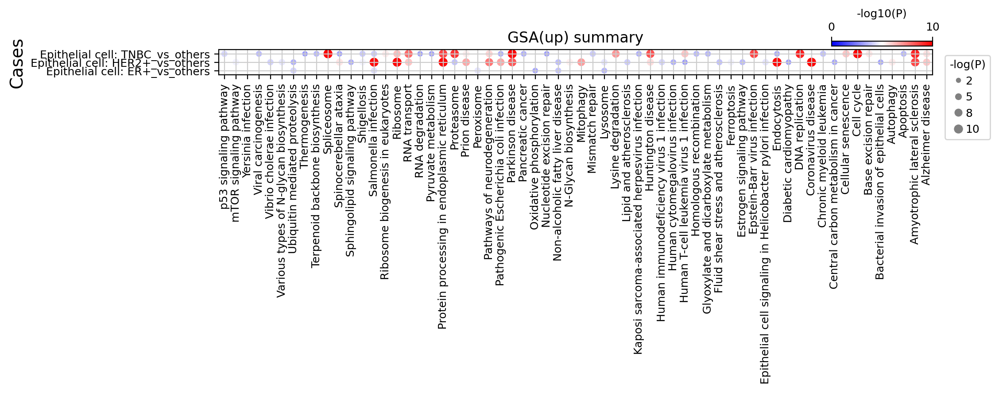

In [31]:
neg_log_p_cutoff = 3

key = 'Epithelial cell' 
gsa_res_t = {key: filter_gsa_result( gsa_res[key], neg_log_p_cutoff )}

plot_gsa_dot( gsa_res_t, title = 'GSA(up) summary', title_fs = 12, 
              tick_fs = 9, xtick_rot = 90, xtick_ha = 'center',
              label_fs = 9, legend_fs = 9, swap_ax = True, 
              dot_size = 40, cbar_frac = 0.15, cbar_gap = 0.1 )

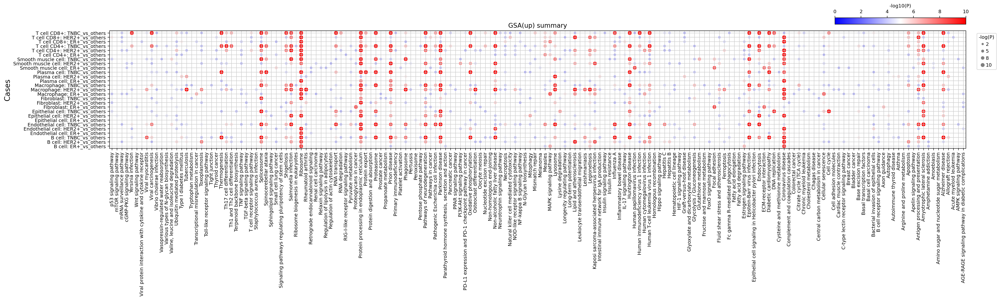

In [32]:
neg_log_p_cutoff = 3

gsa_res_t = {}
for key in gsa_res.keys():
    gsa_res_t[key] = filter_gsa_result( gsa_res[key], neg_log_p_cutoff )

plot_gsa_dot( gsa_res_t, title = 'GSA(up) summary', title_fs = 12, 
              tick_fs = 9, xtick_rot = 90, xtick_ha = 'center',
              label_fs = 9, legend_fs = 9, swap_ax = True, 
              dot_size = 40, cbar_frac = 0.05, cbar_gap = 0.05 )

### __GSEA 분석결과__

In [34]:
gsea_res = adata_t.uns['GSEA']
gsea_res.keys()

dict_keys(['B cell', 'Endothelial cell', 'Epithelial cell', 'Fibroblast', 'Macrophage', 'Plasma cell', 'Smooth muscle cell', 'T cell CD4+', 'T cell CD8+'])

#### __특정 세포 유형에 대한 GSEA 결과 확인__

,Name,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,-log(p-val),-log(q-val)
Term,,,,,,,,,,
Glycosphingolipid biosynthesis,prerank,-0.847528,-1.761028,0.003891,0.443117,0.285,6/16,6.84%,2.409933,0.353481
Retinol metabolism,prerank,-0.837187,-1.754834,0.005277,0.252749,0.311,3/14,2.11%,2.277609,0.597311
Steroid hormone biosynthesis,prerank,-0.838300,-1.750343,0.005161,0.188217,0.339,4/17,2.83%,2.287242,0.725341
Primary bile acid biosynthesis,prerank,-0.856430,-1.743019,0.012623,0.168320,0.389,2/9,1.79%,1.898847,0.773864
Staphylococcus aureus infection,prerank,-0.807312,-1.742025,0.009889,0.137022,0.398,7/22,4.37%,2.004859,0.863209


,Name,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,-log(p-val),-log(q-val)
Term,,,,,,,,,,
Metabolism of xenobiotics by cytochrome P450,prerank,0.833150,2.366996,0.0,0.010564,0.008,7/22,4.42%,20.0,1.976168
Bile secretion,prerank,0.825012,2.314844,0.0,0.014526,0.018,4/22,0.49%,20.0,1.837865
Porphyrin and chlorophyll metabolism,prerank,0.905135,2.284197,0.0,0.013205,0.023,4/12,2.37%,20.0,1.879258
Pentose and glucuronate interconversions,prerank,0.929788,2.273748,0.0,0.013205,0.029,3/11,0.49%,20.0,1.879258
Retinol metabolism,prerank,0.844746,2.250669,0.0,0.015846,0.045,7/15,7.67%,20.0,1.800076


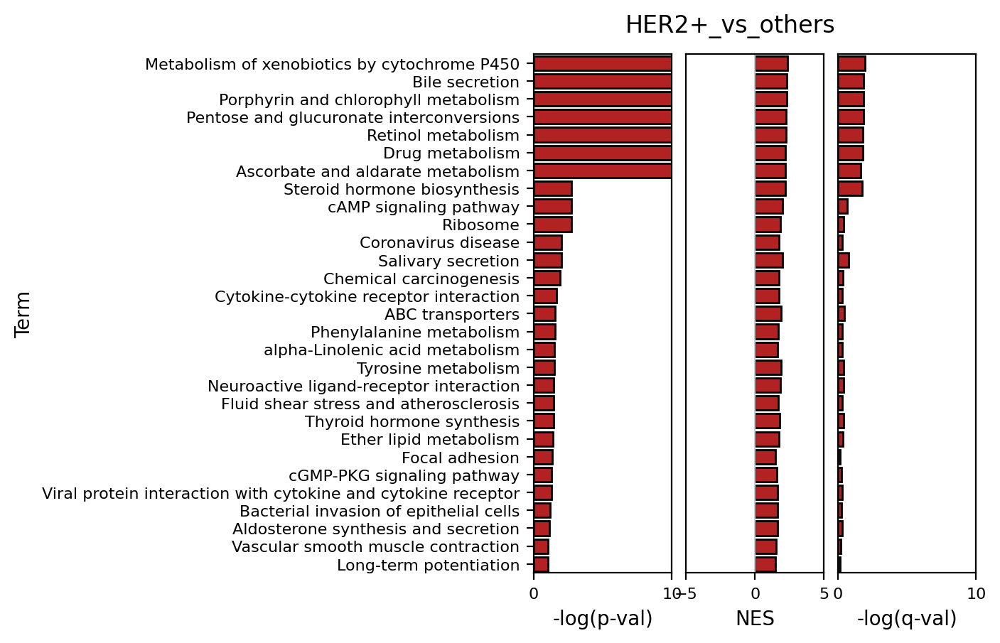

,Name,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,-log(p-val),-log(q-val)
Term,,,,,,,,,,
Bile secretion,prerank,-0.743758,-2.314426,0.000000,0.056571,0.051,4/21,1.80%,20.000000,1.247407
Porphyrin and chlorophyll metabolism,prerank,-0.787623,-2.295958,0.000000,0.035729,0.064,3/17,1.64%,20.000000,1.446979
Retinol metabolism,prerank,-0.804143,-2.228763,0.002041,0.044000,0.108,3/13,5.02%,2.690196,1.356551
ABC transporters,prerank,-0.720538,-2.135393,0.006356,0.100240,0.273,8/19,11.17%,2.196821,0.998960
Metabolism of xenobiotics by cytochrome P450,prerank,-0.652256,-2.077547,0.016495,0.147084,0.438,6/22,6.89%,1.782652,0.832434


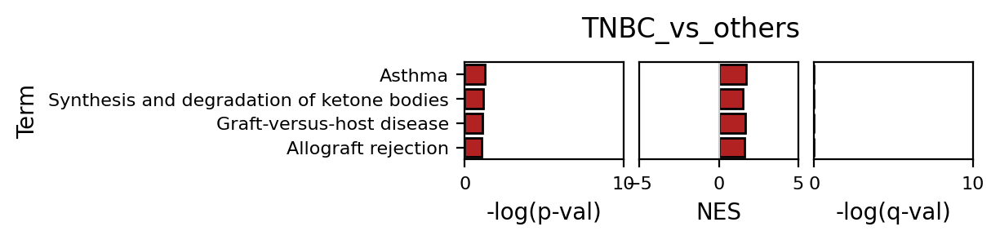

In [42]:
target_cell = 'Epithelial cell'

items_to_plot = ['-log(p-val)', 'NES', '-log(q-val)'] 
lims = [[0, 10], [-5, 5],  [0, 10]] 
N_max_to_show = 30
neg_log_p_cutoff = 1
nes_cutoff = 0 ## selec those with NES > 0


for target_cond in gsa_keys:
    df_res_gsa = gsea_res[target_cell][target_cond]
    display(df_res_gsa.drop(columns = ['Lead_genes', 'Term']).head())
    
    df_res = df_res_gsa.copy(deep = True)
    df_res = df_res.loc[df_res['-log(p-val)'] >= neg_log_p_cutoff ]
    df_res = df_res.loc[df_res['NES'] >= nes_cutoff ]
    df_res = df_res.sort_values(by = '-log(p-val)', ascending = False).iloc[:min(df_res.shape[0], N_max_to_show)]
    terms_sel = list(df_res.index.values)

    if len(terms_sel) > 0:
        plot_gsa_bar( df_res, terms_sel, items_to_plot, lims, 
                  title = target_cond, title_pos = (0.5, 1), title_fs = 12, title_ha = 'center',
                  label_fs = 10, tick_fs = 8, wspace=0.1, hspace=0.25, Ax = None)

#### __Dot plot으로 GSEA 결과 요약__

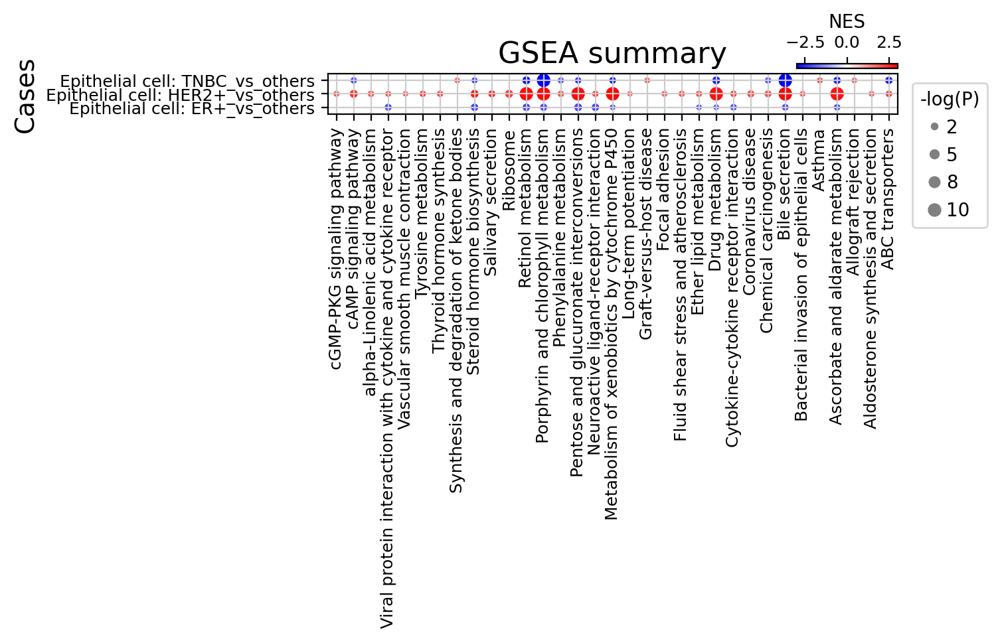

In [40]:
neg_log_p_cutoff = 1

gsea_res_t = {}
key = 'Epithelial cell'
gsea_res_t = {key: filter_gsa_result( gsea_res[key], neg_log_p_cutoff )}

plot_gsa_dot( gsea_res_t, title = 'GSEA summary', title_fs = 16, 
              tick_fs = 9, xtick_rot = 90, xtick_ha = 'center',
              label_fs = 10, legend_fs = 10, swap_ax = True, 
              dot_size = 40, cbar_frac = 0.1, cbar_gap = 0.1 )

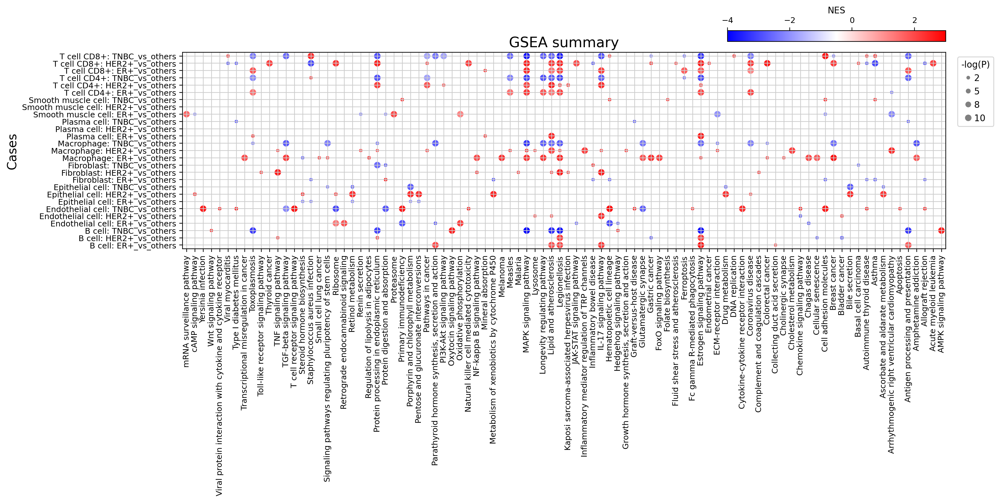

In [41]:
neg_log_p_cutoff = 2

gsea_res_t = {}
for key in gsea_res.keys():
    gsea_res_t[key] = filter_gsa_result( gsea_res[key], neg_log_p_cutoff )

plot_gsa_dot( gsea_res_t, title = 'GSEA summary', title_fs = 16, 
              tick_fs = 9, xtick_rot = 90, xtick_ha = 'center',
              label_fs = 10, legend_fs = 10, swap_ax = True, 
              dot_size = 40, cbar_frac = 0.05, cbar_gap = 0.05 )